# 21_diagnostic_error_maps.ipynb

Универсальный диагностический ноутбук для всех обученных моделей.

## Что делает

1. Загружает все доступные чекпоинты (CNN/DeepONet v2/FNO v1/GeoUNet v1/GeoFNO v1).
2. Прогоняет инференс на полном test-сете.
3. Кластеризует test по `c_max` (соответствует естественной структуре датасета).
4. Считает RMSE / PSNR / SSIM **по кластерам** для каждой модели.
5. Считает per-pixel error maps, агрегирует в **средние карты ошибок** отдельно для
   «лёгких» и «трудных» примеров каждого кластера.
6. Раскладывает ошибки **по частотным полосам** (низкие/средние/высокие моды Фурье)
   — это ключ к ответу на вопрос: упирается модель в **архитектурный потолок**
   (modes truncation, bottleneck) или в **физический потолок** (нелинейность
   forward-оператора, cycle-skipping).

## Главный диагностический вопрос

После предыдущего анализа выявилось два сценария «трудных» примеров:
- **Сценарий A (архитектурный):** ошибка концентрируется на **границах включений**,
  где target имеет резкие переходы — это означает, что модель отрезает высокие
  Fourier-моды (modes=24 для FNO) или теряет high-frequency детали в bottleneck'е
  (192→12 для U-Net). Лечится capacity и/или multi-scale loss.
- **Сценарий B (физический):** ошибка размазана по всей внутренней области фантома,
  амплитудно близкая к контрасту — это означает, что forward-оператор настолько
  нелинеен, что сеть не может однозначно обратить его на одной частоте 500 kHz
  (cycle-skipping). Лечится только multi-frequency данными или physics-informed
  unrolling.

После запуска этого ноутбука будет однозначный ответ.

## 1. Импорты и конфиг

In [1]:
import os
os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false"
os.environ["XLA_PYTHON_CLIENT_ALLOCATOR"] = "platform"
os.environ.pop("LD_LIBRARY_PATH", None)

'/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/cuda/lib64'

In [2]:
from pathlib import Path
import json
import math
import time

import numpy as np
import matplotlib.pyplot as plt

import torch
from torch import nn
import torch.nn.functional as F

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("torch:", torch.__version__, "device:", device)

try:
    from skimage.metrics import structural_similarity as ssim_fn
    HAS_SKIMAGE = True
except Exception:
    HAS_SKIMAGE = False
    ssim_fn = None

torch: 2.11.0+cu130 device: cuda


In [3]:
DIAG = {
    # Where the dataset lives — same as in all training notebooks
    "dataset_root": "/workspace/usct_dataset_v2",

    # Paths to checkpoints. Set to None for any model you don't want to evaluate.
    # The notebook will skip silently for missing/None entries.
    "ckpts": {
        "CNN":         "/workspace/reference_points/cnn_baseline_v0/cnn_baseline_best.pt",
        "DeepONet":    "/workspace/reference_points/deeponet_v2/deeponet_best.pt",
        "FNO":         "/workspace/reference_points/fno_v1/fno_best.pt",
        "GeoUNet":     "/workspace/reference_points/geo_unet_v1/geo_unet_best.pt",
        "GeoFNO":      "/workspace/reference_points/geo_fno_v1/geo_fno_best.pt",
        # "GeoDeepONet": "/workspace/reference_points/geo_deeponet_v1/geo_deeponet_best.pt",
    },

    # Cluster thresholds on c_max (match the histogram modes from the test analysis).
    # Edit if your dataset has different cluster boundaries.
    "cluster_edges_c_max": [1545, 1565, 1580],   # produces 4 clusters: A, B, C, D

    # "easy" / "hard" split within each cluster — by RMSE percentile.
    "easy_quantile": 0.25,
    "hard_quantile": 0.75,

    # Spectral decomposition: where to cut low / mid / high.
    # In Fourier space on (192, 192) grid, modes go from 0 to 96 (rfft).
    # "low":  |k| <= 12   (smooth content, large structures)
    # "mid":  12 < |k| <= 32  (medium structures, ~6-pixel features)
    # "high": |k| > 32   (sharp edges, fine detail)
    "freq_band_low": 12,
    "freq_band_mid": 32,

    # Output directory for diagnostic artifacts
    "out_dir": "/workspace/reference_points/diagnostic_v1",

    # How many "hard" samples to visualize per cluster
    "num_hard_examples": 4,
}
DIAG

{'dataset_root': '/workspace/usct_dataset_v2',
 'ckpts': {'CNN': '/workspace/reference_points/cnn_baseline_v0/cnn_baseline_best.pt',
  'DeepONet': '/workspace/reference_points/deeponet_v2/deeponet_best.pt',
  'FNO': '/workspace/reference_points/fno_v1/fno_best.pt',
  'GeoUNet': '/workspace/reference_points/geo_unet_v1/geo_unet_best.pt',
  'GeoFNO': '/workspace/reference_points/geo_fno_v1/geo_fno_best.pt'},
 'cluster_edges_c_max': [1545, 1565, 1580],
 'easy_quantile': 0.25,
 'hard_quantile': 0.75,
 'freq_band_low': 12,
 'freq_band_mid': 32,
 'out_dir': '/workspace/reference_points/diagnostic_v1',
 'num_hard_examples': 4}

## 2. Файлы, статистика, `M_hom`

Те же блоки, что и во всех тренировочных ноутбуках. Единый residual-pipeline
обязателен: модели обучались на `M − M_hom`, и инференс должен быть таким же.

In [4]:
OUT_ROOT = Path(DIAG["dataset_root"])
test_files = sorted((OUT_ROOT / "test").glob("*.npz"))
train_files = sorted((OUT_ROOT / "train").glob("*.npz"))
print("test:", len(test_files), " train:", len(train_files))

sample0 = np.load(test_files[0])
S, R = sample0["x"].shape[1], sample0["x"].shape[2]
H, W = sample0["c"].shape
dx = tuple(sample0["dx"].astype(np.float32))
freq_hz = float(sample0["freq_hz"][0])

receiver_y_full = np.array(sample0["receiver_y"].astype(np.int32))
receiver_x_full = np.array(sample0["receiver_x"].astype(np.int32))
source_ring_idx_full = np.array(sample0["source_ring_idx"].astype(np.int32))

# c_min/c_max from train (must match training-time stats!)
c_vals = []
for p in train_files:
    c_vals.append(np.load(p)["c"].astype(np.float32))
c_vals = np.stack(c_vals, axis=0)
stats = {"c_min": float(c_vals.min()), "c_max": float(c_vals.max())}
del c_vals

print("S, R, H, W:", S, R, H, W)
print("stats:", stats)

test: 800  train: 6200
S, R, H, W: 16 256 192 192
stats: {'c_min': 1404.1473388671875, 'c_max': 1598.34423828125}


In [5]:
import jax
import jax.numpy as jnp
from jax import jit
from jwave import FourierSeries
from jwave.geometry import Domain, Medium
from jwave.acoustics.time_harmonic import helmholtz_solver

domain = Domain((H, W), dx)
omega = 2 * np.pi * freq_hz

def gaussian_source(H, W, y0, x0, sigma=1.8):
    yy, xx = np.mgrid[0:H, 0:W]
    g = np.exp(-((yy - y0) ** 2 + (xx - x0) ** 2) / (2 * sigma**2))
    g = g / g.sum()
    return g.astype(np.float32)

full_source_fields = []
for ridx in source_ring_idx_full:
    y0, x0 = int(receiver_y_full[ridx]), int(receiver_x_full[ridx])
    src_np = gaussian_source(H, W, y0, x0, sigma=1.8)
    full_source_fields.append(jnp.array(src_np, dtype=jnp.complex64))
full_source_fields = tuple(full_source_fields)

def make_medium(c_map):
    sound_speed = FourierSeries(jnp.expand_dims(jnp.array(c_map), -1), domain)
    return Medium(domain=domain, sound_speed=sound_speed, density=1000.0, pml_size=16)

def forward_measurements_full(c_map):
    medium = make_medium(c_map)
    ms = []
    for i in range(len(full_source_fields)):
        src = FourierSeries(jnp.expand_dims(full_source_fields[i], -1), domain)
        field = helmholtz_solver(medium, omega, src * omega)
        u = field.params[..., 0]
        ms.append(u[receiver_y_full, receiver_x_full])
    return jnp.stack(ms, axis=0)

forward_measurements_full_jit = jit(forward_measurements_full)

c_hom = jnp.full((H, W), 1500.0, dtype=jnp.float32)
M_hom_complex = forward_measurements_full_jit(c_hom)
M_hom_complex.block_until_ready()
M_hom_complex = np.array(M_hom_complex)
print("M_hom_complex:", M_hom_complex.shape, M_hom_complex.dtype)

/tmp/ipykernel_829/2981668139.py:8: UserWarning: A JAX array is being set as static! This can result in unexpected behavior and is usually a mistake to do.
  domain = Domain((H, W), dx)


M_hom_complex: (16, 256) complex64


## 3. Унифицированный sample loader

Возвращает все, что может понадобиться **любой** модели. Каждый predict_*
сам берет нужные ему поля.

In [6]:
def mask_self_receivers(M, source_ring_idx, half_width=2):
    M = M.copy()
    Sl, Rl = M.shape
    for s in range(Sl):
        ridx = int(source_ring_idx[s])
        for delta in range(-half_width, half_width + 1):
            rr = (ridx + delta) % Rl
            M[s, rr] = 0.0 + 0.0j
    return M

def load_sample(path, c_min, c_max, M_hom_complex, mask_half_width=2):
    """Returns dict with: x_tensor, c_phys, c_norm_target, src_norm, rcv_norm, rcv_pixel, meta."""
    d = np.load(path)
    x_raw = d["x"].astype(np.float32)
    c_phys = d["c"].astype(np.float32)
    source_ring_idx = d["source_ring_idx"].astype(np.int64)
    rcv_y = d["receiver_y"].astype(np.int64)
    rcv_x = d["receiver_x"].astype(np.int64)

    M = x_raw[0] + 1j * x_raw[1]
    M = M - M_hom_complex
    if mask_half_width > 0:
        M = mask_self_receivers(M, source_ring_idx, half_width=mask_half_width)

    x_tensor = np.stack([M.real, M.imag], axis=0).astype(np.float32)
    x_scale = float(np.percentile(np.abs(x_tensor), 99.5))
    if x_scale < 1e-8:
        x_scale = 1.0
    x_tensor = x_tensor / x_scale

    src_y_pix = rcv_y[source_ring_idx]
    src_x_pix = rcv_x[source_ring_idx]
    rcv_pixel = np.stack([rcv_y, rcv_x], axis=-1).astype(np.int64)
    rcv_norm = np.stack([
        rcv_y.astype(np.float32) / (H - 1) * 2 - 1,
        rcv_x.astype(np.float32) / (W - 1) * 2 - 1,
    ], axis=-1).astype(np.float32)
    src_norm = np.stack([
        src_y_pix.astype(np.float32) / (H - 1) * 2 - 1,
        src_x_pix.astype(np.float32) / (W - 1) * 2 - 1,
    ], axis=-1).astype(np.float32)

    return {
        "x_tensor": x_tensor,
        "c_phys": c_phys,
        "src_norm": src_norm,
        "rcv_norm": rcv_norm,
        "rcv_pixel": rcv_pixel,
        "meta": {"path": str(path), "x_scale": x_scale,
                 "c_min": float(c_phys.min()), "c_max": float(c_phys.max()),
                 "c_std": float(c_phys.std()), "c_range": float(c_phys.max() - c_phys.min())},
    }

## 4. Определения архитектур для загрузки чекпоинтов

Каждый чекпоинт нужно загружать в его «родную» архитектуру. Здесь скопированы
определения из соответствующих training-ноутбуков 1:1. Если ты используешь
другие гиперпараметры в каком-то из них — нужно править только конфиг ниже.

In [7]:
# === Common helpers ===
def _gn(num_channels):
    g = 1
    for cand in (8, 4, 2):
        if num_channels % cand == 0:
            g = cand
            break
    return nn.GroupNorm(g, num_channels)


# ============================================================
# CNN baseline (SimpleUSCTBaseline from 07_analyze_test_cases)
# ============================================================
class SimpleUSCTBaseline(nn.Module):
    """Encoder + FC + deconv decoder, with Sigmoid output and target in [0, 1]."""
    def __init__(self, H=192, W=192):
        super().__init__()
        self.H, self.W = H, W
        self.enc = nn.Sequential(
            nn.Conv2d(2, 32, 3, padding=1), nn.GroupNorm(1, 32), nn.GELU(),
            nn.Conv2d(32, 64, 3, stride=2, padding=1), nn.GroupNorm(1, 64), nn.GELU(),
            nn.Conv2d(64, 128, 3, stride=2, padding=1), nn.GroupNorm(1, 128), nn.GELU(),
            nn.Conv2d(128, 192, 3, stride=2, padding=1), nn.GroupNorm(1, 192), nn.GELU(),
            nn.Flatten(),
            nn.Linear(192 * 2 * 32, 768), nn.GELU(),
        )
        self.fc = nn.Linear(768, 12 * 12 * 64)
        self.dec = nn.Sequential(
            nn.ConvTranspose2d(64, 64, 4, stride=2, padding=1), nn.GroupNorm(1, 64), nn.GELU(),
            nn.ConvTranspose2d(64, 32, 4, stride=2, padding=1), nn.GroupNorm(1, 32), nn.GELU(),
            nn.ConvTranspose2d(32, 16, 4, stride=2, padding=1), nn.GroupNorm(1, 16), nn.GELU(),
            nn.ConvTranspose2d(16, 1, 4, stride=2, padding=1),
            nn.Sigmoid(),
        )

    def forward(self, x):
        h = self.enc(x)
        h = self.fc(h).view(-1, 64, 12, 12)
        return self.dec(h)


# ============================================================
# DeepONet v2 (from 12_deeponet_train_v2)
# ============================================================
class BranchEncoderV2(nn.Module):
    def __init__(self, out_dim=192, dropout=0.0):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(2, 32, 3, padding=1), nn.GroupNorm(1, 32), nn.GELU(),
            nn.Conv2d(32, 64, 3, stride=2, padding=1), nn.GroupNorm(1, 64), nn.GELU(),
            nn.Conv2d(64, 128, 3, stride=2, padding=1), nn.GroupNorm(1, 128), nn.GELU(),
            nn.Conv2d(128, 192, 3, stride=2, padding=1), nn.GroupNorm(1, 192), nn.GELU(),
            nn.Flatten(),
            nn.Linear(192 * 2 * 32, 384), nn.GELU(), nn.Dropout(dropout),
            nn.Linear(384, out_dim),
        )

    def forward(self, x):
        return self.net(x)


class TrunkNetV2(nn.Module):
    def __init__(self, width=192, hidden=256, num_fourier_features=24, dropout=0.0):
        super().__init__()
        self.num_fourier_features = int(num_fourier_features)
        if self.num_fourier_features > 0:
            freq = 2.0 ** torch.arange(self.num_fourier_features, dtype=torch.float32) * math.pi
            self.register_buffer("freq", freq, persistent=False)
            in_dim = 2 + 4 * self.num_fourier_features
        else:
            self.register_buffer("freq", torch.empty(0), persistent=False)
            in_dim = 2
        self.net = nn.Sequential(
            nn.Linear(in_dim, hidden), nn.GELU(), nn.Dropout(dropout),
            nn.Linear(hidden, hidden), nn.GELU(), nn.Dropout(dropout),
            nn.Linear(hidden, hidden), nn.GELU(),
            nn.Linear(hidden, width),
        )

    def encode_coords(self, coords):
        if self.num_fourier_features == 0:
            return coords
        y = coords[:, 0:1]; x = coords[:, 1:2]
        y_proj = y * self.freq[None, :]
        x_proj = x * self.freq[None, :]
        return torch.cat([coords, torch.sin(y_proj), torch.cos(y_proj),
                          torch.sin(x_proj), torch.cos(x_proj)], dim=1)

    def forward(self, coords):
        return self.net(self.encode_coords(coords))


class DeepONet2DV2(nn.Module):
    def __init__(self, branch_width=192, trunk_width=192, trunk_hidden=256,
                 num_fourier_features=24, dropout=0.0):
        super().__init__()
        self.width = int(branch_width)
        self.branch = BranchEncoderV2(out_dim=branch_width, dropout=dropout)
        self.trunk = TrunkNetV2(width=trunk_width, hidden=trunk_hidden,
                                num_fourier_features=num_fourier_features, dropout=dropout)
        self.bias = nn.Parameter(torch.zeros(1))

    def forward(self, x, coords):
        b = self.branch(x)
        t = self.trunk(coords)
        out = torch.matmul(b, t.t()) / math.sqrt(self.width) + self.bias
        return out.view(x.shape[0], 1, H, W)


# ============================================================
# FNO v1 (from 16_fno_train, with autocast-disable fix)
# ============================================================
class SpectralConv2d(nn.Module):
    def __init__(self, in_ch, out_ch, modes1, modes2):
        super().__init__()
        self.in_channels = in_ch; self.out_channels = out_ch
        self.modes1 = modes1; self.modes2 = modes2
        scale = 1 / (in_ch * out_ch)
        self.weights1 = nn.Parameter(scale * torch.randn(in_ch, out_ch, modes1, modes2, dtype=torch.cfloat))
        self.weights2 = nn.Parameter(scale * torch.randn(in_ch, out_ch, modes1, modes2, dtype=torch.cfloat))

    def compl_mul2d(self, input, weights):
        return torch.einsum("bixy,ioxy->boxy", input, weights)

    def forward(self, x):
        batchsize = x.shape[0]
        with torch.autocast(device_type=x.device.type, enabled=False):
            x = x.float()
            x_ft = torch.fft.rfft2(x)
            out_ft = torch.zeros(batchsize, self.out_channels, x.size(-2), x.size(-1) // 2 + 1,
                                 dtype=torch.cfloat, device=x.device)
            out_ft[:, :, : self.modes1, : self.modes2] = self.compl_mul2d(
                x_ft[:, :, : self.modes1, : self.modes2], self.weights1)
            out_ft[:, :, -self.modes1:, : self.modes2] = self.compl_mul2d(
                x_ft[:, :, -self.modes1:, : self.modes2], self.weights2)
            out = torch.fft.irfft2(out_ft, s=(x.size(-2), x.size(-1)))
        return out


class FNOBlock2d(nn.Module):
    def __init__(self, width, modes1, modes2):
        super().__init__()
        self.spectral = SpectralConv2d(width, width, modes1, modes2)
        self.pointwise = nn.Conv2d(width, width, kernel_size=1)
    def forward(self, x):
        return F.gelu(self.spectral(x) + self.pointwise(x))


class FNO2dBaseline(nn.Module):
    def __init__(self, width=48, depth=4, modes1=24, modes2=24, padding=8):
        super().__init__()
        self.width = width; self.depth = depth; self.padding = padding
        self.input_proj = nn.Conv2d(4, width, kernel_size=1)
        self.blocks = nn.ModuleList([FNOBlock2d(width, modes1, modes2) for _ in range(depth)])
        self.head = nn.Sequential(
            nn.Conv2d(width, width, 1), nn.GELU(), nn.Conv2d(width, 1, 1),
        )

    def get_grid(self, batch_size, device):
        yy = torch.linspace(-1.0, 1.0, H, device=device)
        xx = torch.linspace(-1.0, 1.0, W, device=device)
        gy, gx = torch.meshgrid(yy, xx, indexing="ij")
        return torch.stack([gy, gx], dim=0).unsqueeze(0).repeat(batch_size, 1, 1, 1)

    def forward(self, x):
        x = F.interpolate(x, size=(H, W), mode="bilinear", align_corners=False)
        grid = self.get_grid(x.shape[0], x.device)
        x = torch.cat([x, grid], dim=1)
        x = self.input_proj(x)
        if self.padding > 0:
            x = F.pad(x, [0, self.padding, 0, self.padding])
        for block in self.blocks:
            x = block(x)
        if self.padding > 0:
            x = x[..., :H, :W]
        return self.head(x)

In [8]:
# ============================================================
# Geometry-conditioned modules (from 14_geo_unet_train_v1)
# ============================================================
class GeometryConditionedBranch(nn.Module):
    def __init__(self, token_dim=8, hidden_dim=64, embed_dim=32):
        super().__init__()
        self.embed_dim = int(embed_dim)
        self.mlp = nn.Sequential(
            nn.Linear(token_dim, hidden_dim), nn.GELU(),
            nn.Linear(hidden_dim, hidden_dim), nn.GELU(),
            nn.Linear(hidden_dim, embed_dim),
        )
    def forward(self, x_residual, src_norm, rcv_norm):
        B, _, S, R = x_residual.shape
        src = src_norm.unsqueeze(2).expand(B, S, R, 2)
        rcv = rcv_norm.unsqueeze(1).expand(B, S, R, 2)
        ray = rcv - src
        meas = x_residual.permute(0, 2, 3, 1).contiguous()
        tokens = torch.cat([meas, src, rcv, ray], dim=-1)
        return self.mlp(tokens)


class GeometryAwareLift(nn.Module):
    def __init__(self, embed_dim, H_, W_, source_aggregation="sum"):
        super().__init__()
        self.embed_dim = int(embed_dim); self.H = int(H_); self.W = int(W_)
        self.source_aggregation = source_aggregation
    def forward(self, embeddings, rcv_pixel):
        B, S, R, C = embeddings.shape
        if self.source_aggregation == "sum":
            agg = embeddings.sum(dim=1)
        else:
            agg = embeddings.mean(dim=1)
        rcv_y = rcv_pixel[..., 0].long()
        rcv_x = rcv_pixel[..., 1].long()
        flat_idx = (rcv_y * self.W + rcv_x).unsqueeze(1).expand(B, C, R)
        agg_t = agg.permute(0, 2, 1).contiguous()
        feat_flat = torch.zeros(B, C, self.H * self.W, device=embeddings.device, dtype=agg_t.dtype)
        feat_flat.scatter_add_(2, flat_idx, agg_t)
        return feat_flat.view(B, C, self.H, self.W)


class Spreader(nn.Module):
    def __init__(self, channels, kernel=7, num_layers=2):
        super().__init__()
        layers = []
        for _ in range(num_layers):
            layers += [
                nn.Conv2d(channels, channels, kernel, padding=kernel // 2),
                _gn(channels), nn.GELU(),
            ]
        self.body = nn.Sequential(*layers)
    def forward(self, x):
        return self.body(x)


# ============================================================
# GeoUNet v1 (from 14_geo_unet_train_v1)
# ============================================================
class DoubleConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1), _gn(out_ch), nn.GELU(),
            nn.Conv2d(out_ch, out_ch, 3, padding=1), _gn(out_ch), nn.GELU(),
        )
    def forward(self, x):
        return self.block(x)


class Down(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.pool = nn.MaxPool2d(2)
        self.conv = DoubleConv(in_ch, out_ch)
    def forward(self, x):
        return self.conv(self.pool(x))


class Up(nn.Module):
    def __init__(self, in_ch, skip_ch, out_ch, use_bilinear=True):
        super().__init__()
        self.use_bilinear = use_bilinear
        if use_bilinear:
            self.up = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=False)
            self.reduce = nn.Conv2d(in_ch, in_ch // 2, 1)
            up_out_ch = in_ch // 2
        else:
            self.up = nn.ConvTranspose2d(in_ch, in_ch // 2, 2, stride=2)
            self.reduce = nn.Identity()
            up_out_ch = in_ch // 2
        self.conv = DoubleConv(up_out_ch + skip_ch, out_ch)
    def forward(self, x, skip):
        x = self.up(x); x = self.reduce(x)
        if x.shape[-2:] != skip.shape[-2:]:
            x = F.interpolate(x, size=skip.shape[-2:], mode="bilinear", align_corners=False)
        x = torch.cat([skip, x], dim=1)
        return self.conv(x)


class USCTGeoUNet(nn.Module):
    def __init__(self, embed_dim=32, base_ch=32, target_hw=(192, 192),
                 use_bilinear_up=True, spreader_kernel=7, spreader_layers=2,
                 token_dim=8, branch_hidden=64, source_aggregation="sum"):
        super().__init__()
        self.target_hw = tuple(target_hw)
        H_, W_ = target_hw
        c = int(base_ch)
        self.branch = GeometryConditionedBranch(token_dim, branch_hidden, embed_dim)
        self.lift = GeometryAwareLift(embed_dim, H_, W_, source_aggregation)
        self.spreader = Spreader(embed_dim, spreader_kernel, spreader_layers)
        self.inc = DoubleConv(embed_dim, c)
        self.down1 = Down(c, c * 2); self.down2 = Down(c*2, c * 4)
        self.down3 = Down(c*4, c * 8); self.down4 = Down(c*8, c * 16)
        self.up1 = Up(c*16, c*8, c*8, use_bilinear_up)
        self.up2 = Up(c*8, c*4, c*4, use_bilinear_up)
        self.up3 = Up(c*4, c*2, c*2, use_bilinear_up)
        self.up4 = Up(c*2, c, c, use_bilinear_up)
        self.outc = nn.Conv2d(c, 1, 1)

    def forward(self, x_residual, src_norm, rcv_norm, rcv_pixel):
        emb = self.branch(x_residual, src_norm, rcv_norm)
        feat = self.lift(emb, rcv_pixel)
        feat = self.spreader(feat)
        x1 = self.inc(feat); x2 = self.down1(x1); x3 = self.down2(x2)
        x4 = self.down3(x3); x5 = self.down4(x4)
        x = self.up1(x5, x4); x = self.up2(x, x3)
        x = self.up3(x, x2); x = self.up4(x, x1)
        return self.outc(x)


# ============================================================
# GeoFNO v1 (from 18_geo_fno_train_v1)
# ============================================================
class GeoFNO2d(nn.Module):
    def __init__(self, token_dim=8, branch_hidden=64, embed_dim=32,
                 source_aggregation="sum",
                 spreader_kernel=7, spreader_layers=2,
                 fno_width=48, fno_depth=4, fno_modes_h=24, fno_modes_w=24, fno_padding=8,
                 H_=192, W_=192):
        super().__init__()
        self.H = int(H_); self.W = int(W_); self.padding = int(fno_padding)
        self.branch = GeometryConditionedBranch(token_dim, branch_hidden, embed_dim)
        self.lift = GeometryAwareLift(embed_dim, H_, W_, source_aggregation)
        self.spreader = Spreader(embed_dim, spreader_kernel, spreader_layers)
        self.input_proj = nn.Conv2d(embed_dim + 2, fno_width, 1)
        self.blocks = nn.ModuleList([FNOBlock2d(fno_width, fno_modes_h, fno_modes_w)
                                     for _ in range(fno_depth)])
        self.head = nn.Sequential(
            nn.Conv2d(fno_width, fno_width, 1), nn.GELU(),
            nn.Conv2d(fno_width, 1, 1),
        )

    def get_grid(self, batch_size, device):
        yy = torch.linspace(-1.0, 1.0, self.H, device=device)
        xx = torch.linspace(-1.0, 1.0, self.W, device=device)
        gy, gx = torch.meshgrid(yy, xx, indexing="ij")
        return torch.stack([gy, gx], dim=0).unsqueeze(0).repeat(batch_size, 1, 1, 1)

    def forward(self, x_residual, src_norm, rcv_norm, rcv_pixel):
        emb = self.branch(x_residual, src_norm, rcv_norm)
        feat = self.lift(emb, rcv_pixel)
        feat = self.spreader(feat)
        grid = self.get_grid(feat.shape[0], feat.device)
        feat = torch.cat([feat, grid], dim=1)
        feat = self.input_proj(feat)
        if self.padding > 0:
            feat = F.pad(feat, [0, self.padding, 0, self.padding])
        for block in self.blocks:
            feat = block(feat)
        if self.padding > 0:
            feat = feat[..., :self.H, :self.W]
        return self.head(feat)

## 5. Predictor wrappers

Каждая функция принимает (model, sample_dict) и возвращает predicted speed map в
**физических** единицах (м/с). Денормализация делается тут же, чтобы все модели
можно было сравнивать через одни и те же метрики.

In [9]:
def denorm_minus1_1(c_norm, c_min, c_max):
    return ((c_norm + 1.0) * 0.5) * (c_max - c_min) + c_min

def denorm_0_1(c_norm, c_min, c_max):
    return c_norm * (c_max - c_min) + c_min


@torch.no_grad()
def predict_cnn(model, sample, c_min, c_max):
    x = torch.from_numpy(sample["x_tensor"]).unsqueeze(0).to(device)
    pred = model(x)[0, 0].cpu().numpy()
    pred = np.clip(pred, 0.0, 1.0)
    return denorm_0_1(pred, c_min, c_max)


@torch.no_grad()
def predict_deeponet(model, sample, c_min, c_max, coords):
    x = torch.from_numpy(sample["x_tensor"]).unsqueeze(0).to(device)
    pred = model(x, coords)[0, 0].cpu().numpy()
    pred = np.clip(pred, -1.0, 1.0)
    return denorm_minus1_1(pred, c_min, c_max)


@torch.no_grad()
def predict_fno(model, sample, c_min, c_max):
    x = torch.from_numpy(sample["x_tensor"]).unsqueeze(0).to(device)
    pred = model(x)[0, 0].cpu().numpy()
    pred = np.clip(pred, -1.0, 1.0)
    return denorm_minus1_1(pred, c_min, c_max)


@torch.no_grad()
def predict_geo(model, sample, c_min, c_max):
    x  = torch.from_numpy(sample["x_tensor"]).unsqueeze(0).to(device)
    sn = torch.from_numpy(sample["src_norm"]).unsqueeze(0).to(device)
    rn = torch.from_numpy(sample["rcv_norm"]).unsqueeze(0).to(device)
    rp = torch.from_numpy(sample["rcv_pixel"]).unsqueeze(0).to(device)
    pred = model(x, sn, rn, rp)[0, 0].cpu().numpy()
    pred = np.clip(pred, -1.0, 1.0)
    return denorm_minus1_1(pred, c_min, c_max)

## 6. Загрузка чекпоинтов

Перебираем `DIAG["ckpts"]`, для каждого пути проверяем существование. Если файл
есть — собираем модель нужного класса и грузим. Если нет — молча пропускаем.

In [10]:
# Coords for DeepONet trunk
yy_t = torch.linspace(-1.0, 1.0, H)
xx_t = torch.linspace(-1.0, 1.0, W)
gy_t, gx_t = torch.meshgrid(yy_t, xx_t, indexing="ij")
coords_full = torch.stack([gy_t.reshape(-1), gx_t.reshape(-1)], dim=1).to(device)

models = {}                         # name -> (model_object, predict_fn)

def _try_load(name, build_fn, predict_fn):
    path = DIAG["ckpts"].get(name)
    if path is None:
        print(f"  [skip] {name}: no ckpt path in config")
        return
    p = Path(path)
    if not p.exists():
        print(f"  [skip] {name}: file not found ({p})")
        return
    try:
        ckpt = torch.load(p, map_location=device)
        m = build_fn().to(device)
        m.load_state_dict(ckpt["model_state_dict"])
        m.eval()
        n_params = sum(pp.numel() for pp in m.parameters())
        models[name] = (m, predict_fn)
        print(f"  [ ok ] {name}: {n_params:,} params  ({p.name})")
    except Exception as e:
        print(f"  [err ] {name}: {e}")

print("Loading models...")

_try_load(
    "CNN",
    build_fn=lambda: SimpleUSCTBaseline(H=H, W=W),
    predict_fn=lambda mdl, smp: predict_cnn(mdl, smp, stats["c_min"], stats["c_max"]),
)
_try_load(
    "DeepONet",
    build_fn=lambda: DeepONet2DV2(branch_width=192, trunk_width=192, trunk_hidden=256, num_fourier_features=24),
    predict_fn=lambda mdl, smp: predict_deeponet(mdl, smp, stats["c_min"], stats["c_max"], coords_full),
)
_try_load(
    "FNO",
    build_fn=lambda: FNO2dBaseline(width=48, depth=4, modes1=24, modes2=24, padding=8),
    predict_fn=lambda mdl, smp: predict_fno(mdl, smp, stats["c_min"], stats["c_max"]),
)
_try_load(
    "GeoUNet",
    build_fn=lambda: USCTGeoUNet(embed_dim=32, base_ch=32, target_hw=(H, W),
                                  use_bilinear_up=True, spreader_kernel=7, spreader_layers=2,
                                  token_dim=8, branch_hidden=64, source_aggregation="sum"),
    predict_fn=lambda mdl, smp: predict_geo(mdl, smp, stats["c_min"], stats["c_max"]),
)
_try_load(
    "GeoFNO",
    build_fn=lambda: GeoFNO2d(token_dim=8, branch_hidden=64, embed_dim=32, source_aggregation="sum",
                              spreader_kernel=7, spreader_layers=2,
                              fno_width=48, fno_depth=4, fno_modes_h=24, fno_modes_w=24, fno_padding=8,
                              H_=H, W_=W),
    predict_fn=lambda mdl, smp: predict_geo(mdl, smp, stats["c_min"], stats["c_max"]),
)

print(f"\nLoaded {len(models)} models: {list(models.keys())}")

Loading models...
  [err ] CNN: Error(s) in loading state_dict for SimpleUSCTBaseline:
	Missing key(s) in state_dict: "enc.0.weight", "enc.0.bias", "enc.1.weight", "enc.1.bias", "enc.3.weight", "enc.3.bias", "enc.4.weight", "enc.4.bias", "enc.6.weight", "enc.6.bias", "enc.7.weight", "enc.7.bias", "enc.9.weight", "enc.9.bias", "enc.10.weight", "enc.10.bias", "enc.13.weight", "enc.13.bias", "fc.weight", "fc.bias", "dec.1.weight", "dec.1.bias", "dec.3.weight", "dec.3.bias", "dec.7.weight", "dec.7.bias", "dec.9.weight", "dec.9.bias". 
	Unexpected key(s) in state_dict: "enc1.block.0.weight", "enc1.block.0.bias", "enc1.block.1.weight", "enc1.block.1.bias", "enc1.block.3.weight", "enc1.block.3.bias", "enc1.block.4.weight", "enc1.block.4.bias", "enc2.block.0.weight", "enc2.block.0.bias", "enc2.block.1.weight", "enc2.block.1.bias", "enc2.block.3.weight", "enc2.block.3.bias", "enc2.block.4.weight", "enc2.block.4.bias", "enc3.block.0.weight", "enc3.block.0.bias", "enc3.block.1.weight", "enc3.bloc

## 7. Инференс на полном test-сете

На каждый сэмпл прогоняем все модели, сохраняем:
- `c_phys` — target,
- `pred_phys[name]` — предсказание каждой модели,
- метаданные сэмпла.

Чтобы не держать в памяти 800×192×192×N_models float32 (~600 MB), сразу
вычисляем error map и метрики, а полные предсказания сохраняем только для
небольшой случайной выборки.

In [11]:
out_dir = Path(DIAG["out_dir"])
out_dir.mkdir(parents=True, exist_ok=True)

c_min, c_max_global = stats["c_min"], stats["c_max"]
data_range = float(c_max_global - c_min)

# per-model running aggregates
agg = {name: {
    "sum_err_map": np.zeros((H, W), dtype=np.float64),
    "sum_err_map_easy": np.zeros((H, W), dtype=np.float64),
    "sum_err_map_hard": np.zeros((H, W), dtype=np.float64),
    "count_easy": 0, "count_hard": 0,
    "per_sample": [],   # list of dicts with metrics
} for name in models.keys()}

# We also keep a small set of raw predictions for visualisation
KEEP_RAW = 10  # samples to keep full predictions for
raw_keep_idx = set(np.random.RandomState(0).choice(len(test_files), size=min(KEEP_RAW, len(test_files)), replace=False))
raw_storage = {name: [] for name in models.keys()}

t0 = time.time()
for idx, p in enumerate(test_files):
    sample = load_sample(p, c_min, c_max_global, M_hom_complex)
    target = sample["c_phys"]
    meta = sample["meta"]
    for name, (mdl, predict_fn) in models.items():
        pred = predict_fn(mdl, sample)
        err = pred - target

        m = {
            "index": idx,
            "path": meta["path"],
            "c_max": meta["c_max"], "c_min": meta["c_min"],
            "c_std": meta["c_std"], "c_range": meta["c_range"],
            "rmse": float(np.sqrt(np.mean(err ** 2))),
            "mae":  float(np.mean(np.abs(err))),
            "l_inf": float(np.max(np.abs(err))),
        }
        if HAS_SKIMAGE:
            m["ssim"] = float(ssim_fn(pred, target, data_range=data_range))
        m["psnr"] = float(20 * np.log10(data_range) - 10 * np.log10(max(np.mean(err ** 2), 1e-12)))

        agg[name]["per_sample"].append(m)
        agg[name]["sum_err_map"] += np.abs(err)

        if idx in raw_keep_idx:
            raw_storage[name].append({"idx": idx, "pred": pred, "target": target, "err": err, "meta": meta})

    if (idx + 1) % 100 == 0:
        elapsed = time.time() - t0
        print(f"  {idx+1}/{len(test_files)}  elapsed={elapsed:.1f}s")

print(f"\nDone in {time.time() - t0:.1f}s")

  100/800  elapsed=1.0s
  200/800  elapsed=1.8s
  300/800  elapsed=2.6s
  400/800  elapsed=3.4s
  500/800  elapsed=4.2s
  600/800  elapsed=5.0s
  700/800  elapsed=5.8s
  800/800  elapsed=6.6s

Done in 6.6s


## 8. Кластеризация по `c_max`

Используем границы из конфига (по умолчанию [1545, 1565, 1580]). 4 кластера: A, B, C, D.

In [12]:
edges = DIAG["cluster_edges_c_max"]
cluster_names = ["A", "B", "C", "D"][:len(edges) + 1]

def assign_cluster(c_max_val):
    for i, e in enumerate(edges):
        if c_max_val < e:
            return cluster_names[i]
    return cluster_names[-1]

# Cluster assignment per sample (same for all models — depends only on data)
sample_clusters = []
for p in test_files:
    cm = float(np.load(p)["c"].max())
    sample_clusters.append(assign_cluster(cm))
sample_clusters = np.array(sample_clusters)

print("Cluster sizes:")
for cn in cluster_names:
    n = int((sample_clusters == cn).sum())
    print(f"  {cn}: n = {n}")

Cluster sizes:
  A: n = 100
  B: n = 600
  C: n = 15
  D: n = 85


## 9. Per-cluster summary table

Главная таблица для ВКР: RMSE / PSNR / SSIM для каждой модели **отдельно по
каждому кластеру** + overall.

In [13]:
def summary_for_subset(metrics_list, indices):
    if len(indices) == 0:
        return None
    sub = [metrics_list[i] for i in indices]
    keys = ["rmse", "mae", "l_inf", "psnr"] + (["ssim"] if HAS_SKIMAGE else [])
    out = {"n": len(sub)}
    for k in keys:
        vs = [m[k] for m in sub]
        out[f"{k}_mean"] = float(np.mean(vs))
        out[f"{k}_std"]  = float(np.std(vs))
        out[f"{k}_p25"]  = float(np.percentile(vs, 25))
        out[f"{k}_p50"]  = float(np.percentile(vs, 50))
        out[f"{k}_p75"]  = float(np.percentile(vs, 75))
    return out

per_cluster = {name: {} for name in models.keys()}
for name in models.keys():
    metrics_list = agg[name]["per_sample"]
    for cn in cluster_names:
        idxs = np.where(sample_clusters == cn)[0].tolist()
        per_cluster[name][cn] = summary_for_subset(metrics_list, idxs)
    per_cluster[name]["overall"] = summary_for_subset(metrics_list, list(range(len(metrics_list))))

# pretty-print as a table
print("\n=== RMSE_mean per cluster ===")
hdr = f"  {'model':<14}" + "  ".join([f"{cn} (n={int((sample_clusters==cn).sum()):3d})" for cn in cluster_names]) + "   overall"
print(hdr)
for name in models.keys():
    row = f"  {name:<14}"
    for cn in cluster_names:
        s = per_cluster[name][cn]
        row += f"     {s['rmse_mean']:6.2f}     " if s else "      n/a      "
    s = per_cluster[name]["overall"]
    row += f"  {s['rmse_mean']:6.2f}"
    print(row)

# Save
with open(out_dir / "per_cluster_summary.json", "w", encoding="utf-8") as f:
    json.dump(per_cluster, f, ensure_ascii=False, indent=2)
print(f"\nSaved to {out_dir / 'per_cluster_summary.json'}")


=== RMSE_mean per cluster ===
  model         A (n=100)  B (n=600)  C (n= 15)  D (n= 85)   overall
  DeepONet             9.27           14.12           16.09           17.68        13.93
  FNO                 11.77           16.89           19.42           21.08        16.74
  GeoUNet             13.52           18.92           21.49           23.40        18.77
  GeoFNO              14.02           19.03           20.35           22.23        18.76

Saved to /workspace/reference_points/diagnostic_v1/per_cluster_summary.json


## 10. Easy / Hard split внутри каждого кластера

Внутри каждого кластера делим примеры на «лёгкие» (RMSE ≤ p25) и «трудные» (RMSE
≥ p75) и усредняем error map по каждой группе. Это и есть главная диагностика:

- Если **средняя hard-карта ошибок** концентрируется на **границах фантома и
  мелких включениях** — дело в архитектурном потолке (modes, bottleneck).
- Если **средняя hard-карта** размазана по всей внутренней области — дело в
  нелинейности forward-оператора (физический потолок).

In [14]:
def aggregate_error_maps_per_cluster(name):
    metrics_list = agg[name]["per_sample"]
    per_cluster_maps = {}
    for cn in cluster_names:
        idxs = np.where(sample_clusters == cn)[0]
        if len(idxs) == 0:
            continue
        rmses = np.array([metrics_list[i]["rmse"] for i in idxs])
        easy_thresh = np.quantile(rmses, DIAG["easy_quantile"])
        hard_thresh = np.quantile(rmses, DIAG["hard_quantile"])
        easy_idx = idxs[rmses <= easy_thresh]
        hard_idx = idxs[rmses >= hard_thresh]

        # Re-load and accumulate error maps (memory-friendly)
        easy_map = np.zeros((H, W), dtype=np.float64)
        hard_map = np.zeros((H, W), dtype=np.float64)
        target_easy = np.zeros((H, W), dtype=np.float64)
        target_hard = np.zeros((H, W), dtype=np.float64)
        mdl, predict_fn = models[name]
        for i in easy_idx:
            sample = load_sample(test_files[i], c_min, c_max_global, M_hom_complex)
            pred = predict_fn(mdl, sample)
            easy_map += np.abs(pred - sample["c_phys"])
            target_easy += sample["c_phys"]
        for i in hard_idx:
            sample = load_sample(test_files[i], c_min, c_max_global, M_hom_complex)
            pred = predict_fn(mdl, sample)
            hard_map += np.abs(pred - sample["c_phys"])
            target_hard += sample["c_phys"]
        if len(easy_idx) > 0: easy_map /= len(easy_idx); target_easy /= len(easy_idx)
        if len(hard_idx) > 0: hard_map /= len(hard_idx); target_hard /= len(hard_idx)

        per_cluster_maps[cn] = {
            "easy_map": easy_map, "hard_map": hard_map,
            "target_easy_avg": target_easy, "target_hard_avg": target_hard,
            "n_easy": int(len(easy_idx)), "n_hard": int(len(hard_idx)),
            "easy_thresh": float(easy_thresh), "hard_thresh": float(hard_thresh),
        }
    return per_cluster_maps

cluster_error_maps = {}
for name in models.keys():
    print(f"  computing error maps for {name}...")
    cluster_error_maps[name] = aggregate_error_maps_per_cluster(name)
print("done.")

  computing error maps for DeepONet...
  computing error maps for FNO...
  computing error maps for GeoUNet...
  computing error maps for GeoFNO...
done.


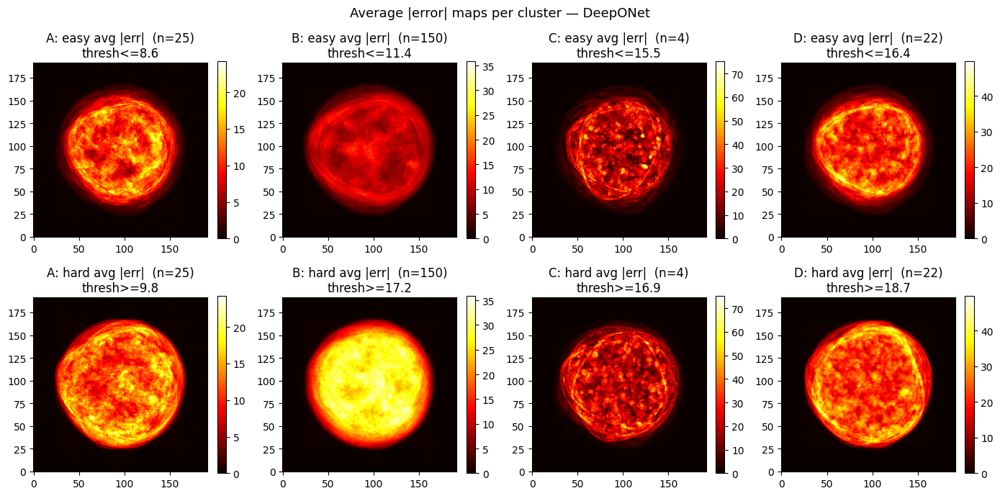

  saved /workspace/reference_points/diagnostic_v1/error_maps_DeepONet.png


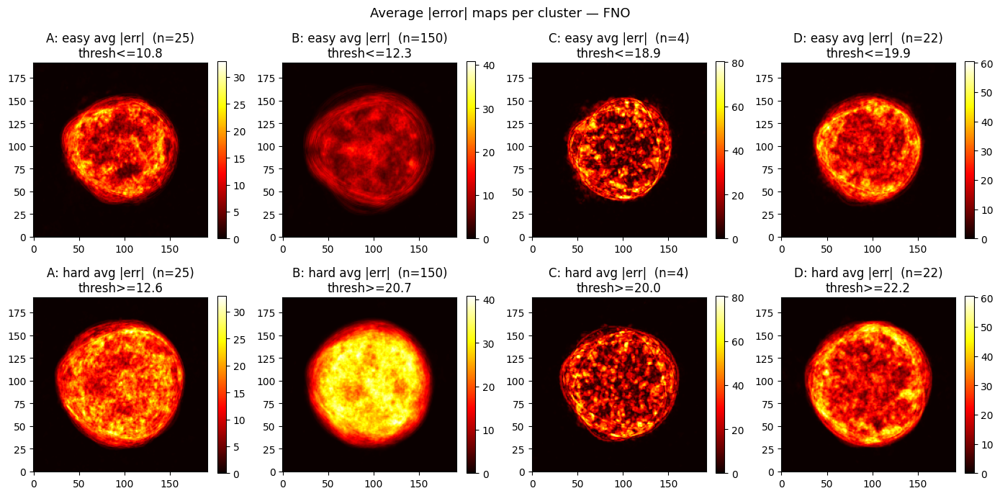

  saved /workspace/reference_points/diagnostic_v1/error_maps_FNO.png


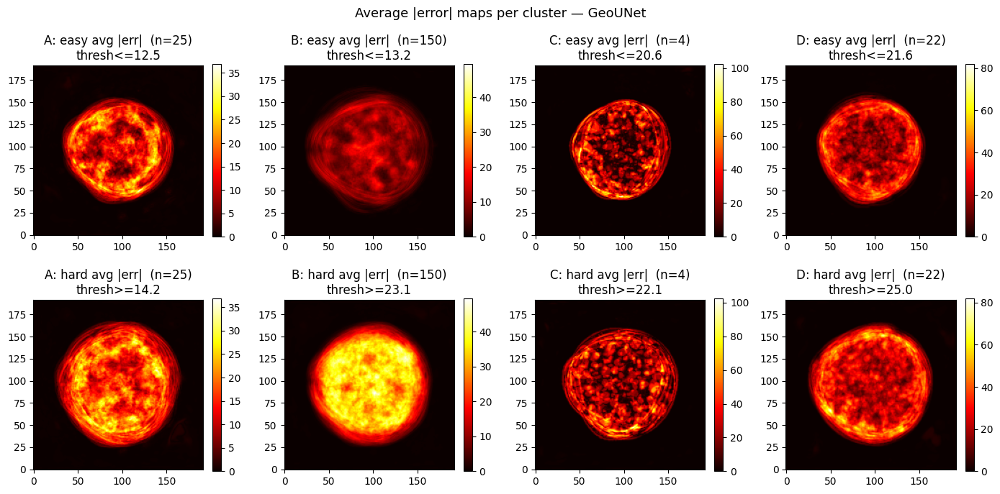

  saved /workspace/reference_points/diagnostic_v1/error_maps_GeoUNet.png


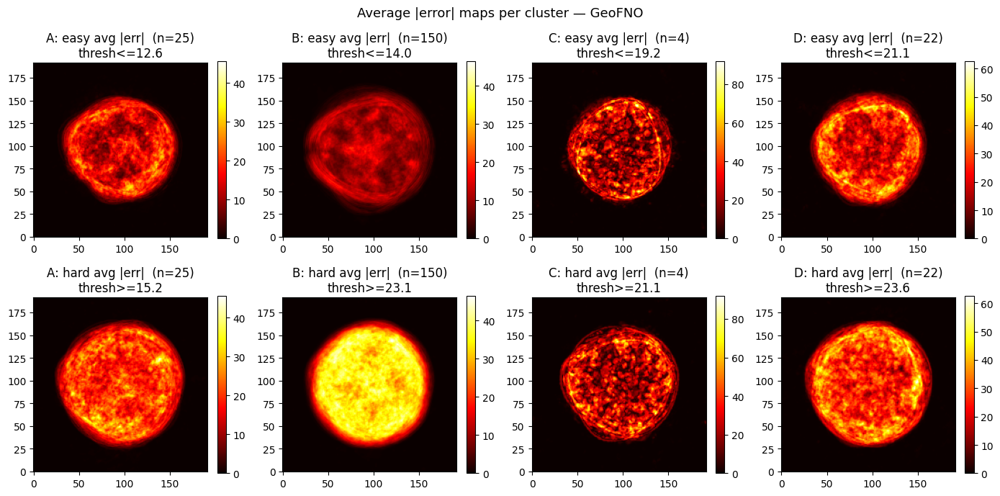

  saved /workspace/reference_points/diagnostic_v1/error_maps_GeoFNO.png


In [15]:
# Visualize: for each model, one row of (cluster, easy_avg_err, hard_avg_err)
for name in models.keys():
    n_clusters = len(cluster_error_maps[name])
    fig, axes = plt.subplots(2, n_clusters, figsize=(3.5 * n_clusters, 7))
    if n_clusters == 1:
        axes = axes.reshape(2, 1)

    for col, (cn, maps) in enumerate(cluster_error_maps[name].items()):
        vmax = max(maps["easy_map"].max(), maps["hard_map"].max(), 1e-6)

        im0 = axes[0, col].imshow(maps["easy_map"], origin="lower", vmin=0, vmax=vmax, cmap="hot")
        axes[0, col].set_title(f"{cn}: easy avg |err|  (n={maps['n_easy']})\nthresh<={maps['easy_thresh']:.1f}")
        plt.colorbar(im0, ax=axes[0, col], fraction=0.046)

        im1 = axes[1, col].imshow(maps["hard_map"], origin="lower", vmin=0, vmax=vmax, cmap="hot")
        axes[1, col].set_title(f"{cn}: hard avg |err|  (n={maps['n_hard']})\nthresh>={maps['hard_thresh']:.1f}")
        plt.colorbar(im1, ax=axes[1, col], fraction=0.046)

    fig.suptitle(f"Average |error| maps per cluster — {name}", fontsize=13)
    plt.tight_layout()
    fig_path = out_dir / f"error_maps_{name}.png"
    plt.savefig(fig_path, dpi=120, bbox_inches="tight")
    plt.show()
    print(f"  saved {fig_path}")

## 11. Спектральная декомпозиция ошибок

Раскладываем error map в Фурье-пространстве на 3 полосы:
- **low** (`|k| ≤ low_band`): крупные структуры, плавные изменения
- **mid** (`low_band < |k| ≤ mid_band`): средние структуры (~6-pixel features)
- **high** (`|k| > mid_band`): резкие границы, мелкая детализация

Энергия ошибки в каждой полосе показывает, где именно сеть промахивается. Если
доминирует high-band — это modes truncation / bottleneck. Если low/mid — это
нелинейность forward-оператора.

In [16]:
def freq_band_energy(err_map, low_band, mid_band):
    """Returns dict with low/mid/high energy fractions."""
    F = np.fft.rfft2(err_map)
    H_, Wh = F.shape
    ky = np.fft.fftfreq(H_, d=1.0) * H_
    kx = np.arange(Wh)
    KY, KX = np.meshgrid(ky, kx, indexing="ij")
    K = np.sqrt(KY * KY + KX * KX)

    energy = (np.abs(F) ** 2)
    total = energy.sum()
    if total < 1e-12:
        return {"low": 0.0, "mid": 0.0, "high": 0.0, "total": 0.0}
    e_low = energy[K <= low_band].sum()
    e_mid = energy[(K > low_band) & (K <= mid_band)].sum()
    e_high = energy[K > mid_band].sum()
    return {"low": float(e_low / total), "mid": float(e_mid / total),
            "high": float(e_high / total), "total": float(total)}


low_b = DIAG["freq_band_low"]
mid_b = DIAG["freq_band_mid"]

spec_table = {}  # name -> cluster -> {easy: bands, hard: bands}
print("\n=== Spectral energy distribution of error maps ===")
print(f"  bands: low |k|<={low_b}, mid<={mid_b}, high>{mid_b}")
print()

for name in models.keys():
    spec_table[name] = {}
    print(f"  {name}")
    print(f"    {'cluster':<12} {'easy_low':>9} {'easy_mid':>9} {'easy_high':>10}    {'hard_low':>9} {'hard_mid':>9} {'hard_high':>10}")
    for cn, maps in cluster_error_maps[name].items():
        be = freq_band_energy(maps["easy_map"], low_b, mid_b)
        bh = freq_band_energy(maps["hard_map"], low_b, mid_b)
        spec_table[name][cn] = {"easy": be, "hard": bh}
        print(f"    {cn:<12} {be['low']:9.3f} {be['mid']:9.3f} {be['high']:10.3f}    {bh['low']:9.3f} {bh['mid']:9.3f} {bh['high']:10.3f}")
    print()

with open(out_dir / "spectral_decomposition.json", "w", encoding="utf-8") as f:
    # convert nested dicts safely
    json.dump(spec_table, f, ensure_ascii=False, indent=2)
print(f"saved to {out_dir / 'spectral_decomposition.json'}")


=== Spectral energy distribution of error maps ===
  bands: low |k|<=12, mid<=32, high>32

  DeepONet
    cluster       easy_low  easy_mid  easy_high     hard_low  hard_mid  hard_high
    A                0.984     0.010      0.007        0.985     0.010      0.005
    B                0.994     0.003      0.002        0.998     0.001      0.001
    C                0.924     0.044      0.032        0.934     0.038      0.027
    D                0.983     0.011      0.006        0.984     0.012      0.005

  FNO
    cluster       easy_low  easy_mid  easy_high     hard_low  hard_mid  hard_high
    A                0.971     0.019      0.010        0.980     0.014      0.007
    B                0.988     0.008      0.004        0.996     0.003      0.001
    C                0.881     0.078      0.041        0.892     0.071      0.037
    D                0.973     0.018      0.009        0.976     0.017      0.006

  GeoUNet
    cluster       easy_low  easy_mid  easy_high     hard_lo

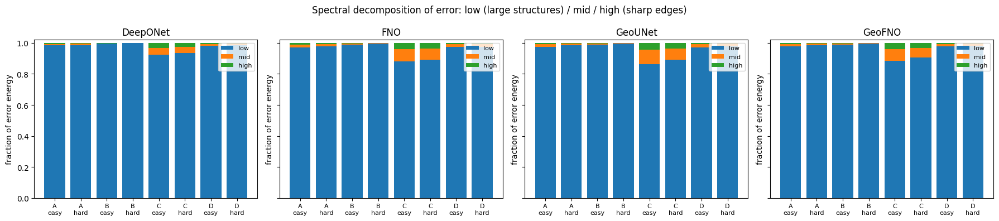

saved to /workspace/reference_points/diagnostic_v1/spectral_decomposition.png


In [17]:
# Visualize spectral decomposition as stacked bars
fig, axes = plt.subplots(1, len(models), figsize=(4.5 * len(models), 4), sharey=True)
if len(models) == 1:
    axes = [axes]

cluster_x_labels = []
for cn in cluster_names:
    cluster_x_labels.append(f"{cn}\neasy"); cluster_x_labels.append(f"{cn}\nhard")
n_bars = len(cluster_x_labels)

for ax, name in zip(axes, models.keys()):
    lows, mids, highs = [], [], []
    for cn in cluster_names:
        if cn not in spec_table[name]:
            lows += [0, 0]; mids += [0, 0]; highs += [0, 0]
            continue
        be = spec_table[name][cn]["easy"]; bh = spec_table[name][cn]["hard"]
        lows += [be["low"], bh["low"]]
        mids += [be["mid"], bh["mid"]]
        highs += [be["high"], bh["high"]]
    xs = np.arange(n_bars)
    ax.bar(xs, lows, label="low")
    ax.bar(xs, mids, bottom=lows, label="mid")
    ax.bar(xs, highs, bottom=np.array(lows) + np.array(mids), label="high")
    ax.set_xticks(xs); ax.set_xticklabels(cluster_x_labels, fontsize=8)
    ax.set_title(name); ax.set_ylim(0, 1.02)
    ax.set_ylabel("fraction of error energy")
    ax.legend(loc="upper right", fontsize=8)

fig.suptitle("Spectral decomposition of error: low (large structures) / mid / high (sharp edges)", fontsize=12)
plt.tight_layout()
fig_path = out_dir / "spectral_decomposition.png"
plt.savefig(fig_path, dpi=120, bbox_inches="tight")
plt.show()
print(f"saved to {fig_path}")

## 12. Самые трудные примеры в каждом кластере

Для каждой модели в каждом кластере находим N примеров с наибольшей RMSE и
показываем их (target / pred / |err|). Это даёт качественное понимание:
действительно ли модель ошибается на границах включений или внутри.

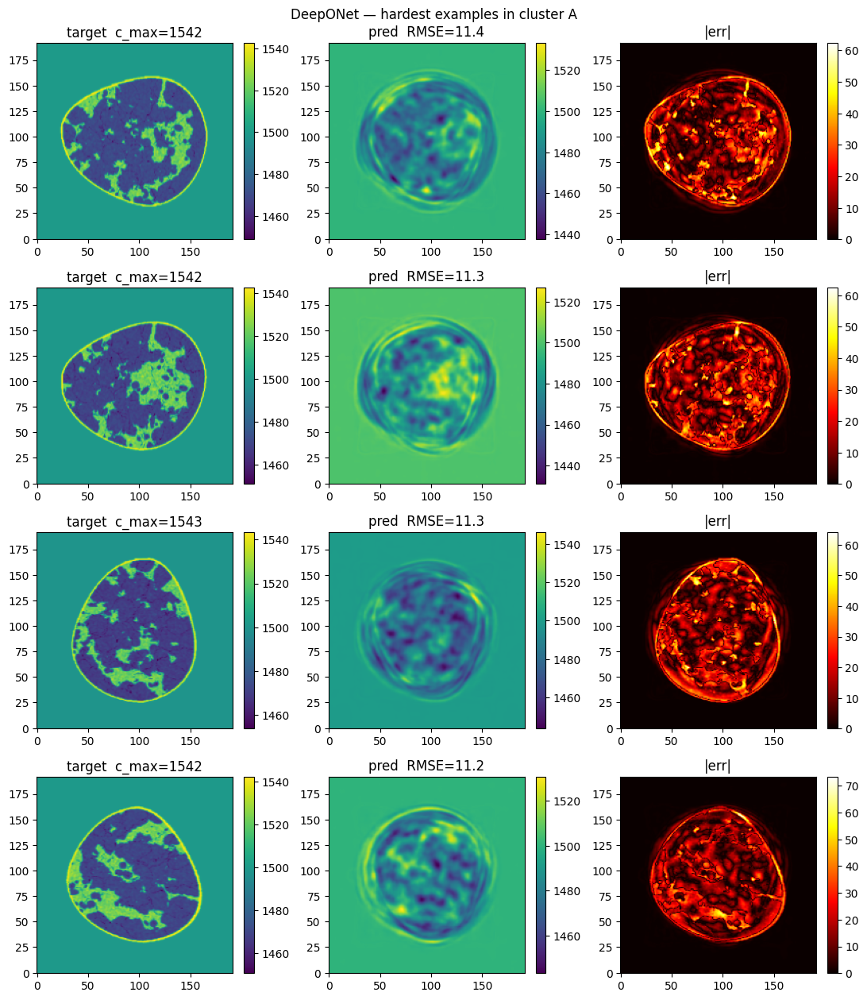

  saved /workspace/reference_points/diagnostic_v1/hard_examples_DeepONet_A.png


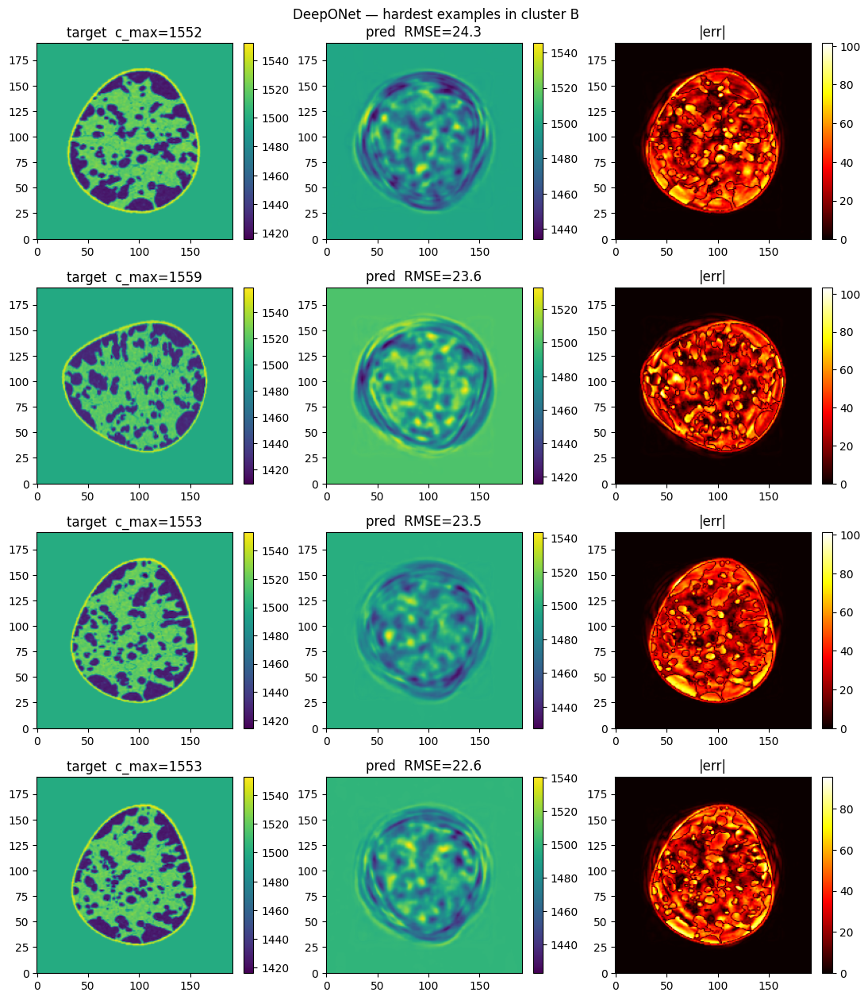

  saved /workspace/reference_points/diagnostic_v1/hard_examples_DeepONet_B.png


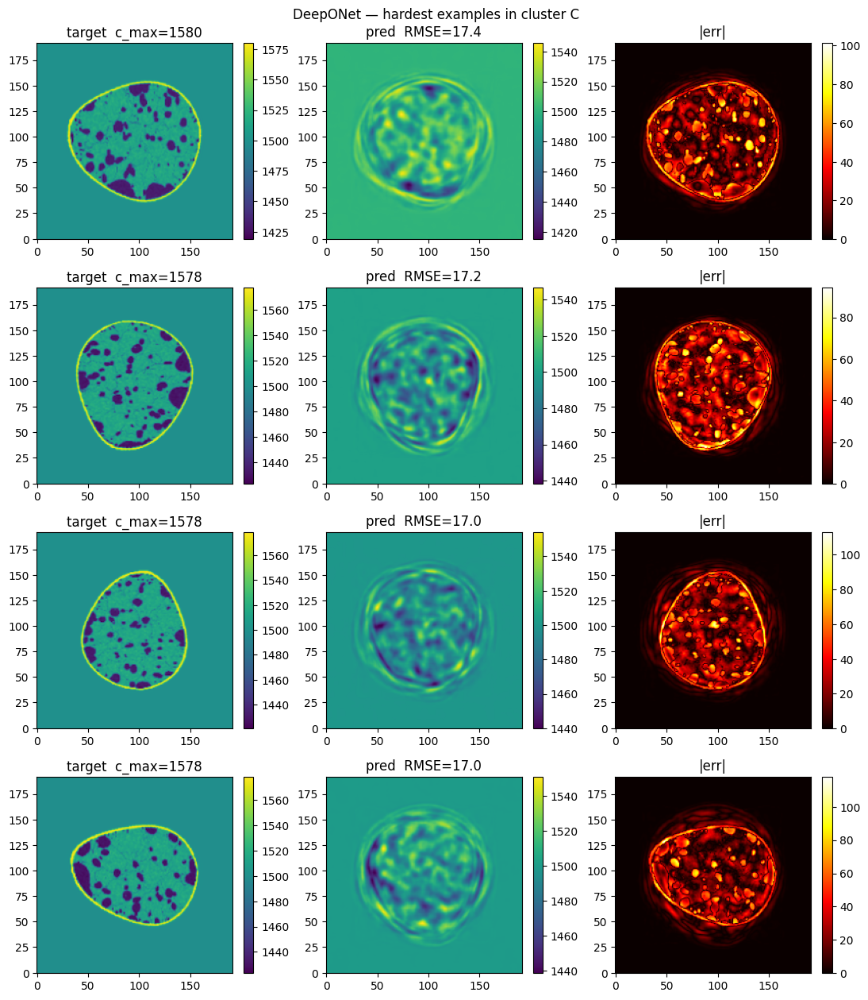

  saved /workspace/reference_points/diagnostic_v1/hard_examples_DeepONet_C.png


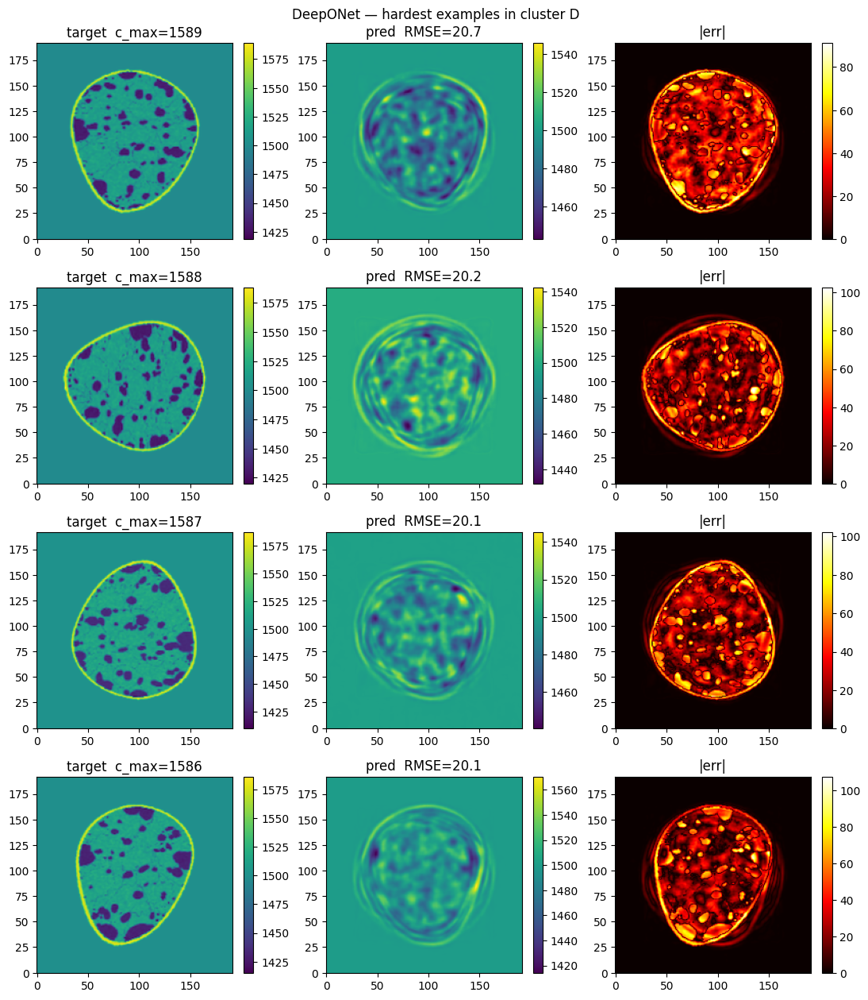

  saved /workspace/reference_points/diagnostic_v1/hard_examples_DeepONet_D.png


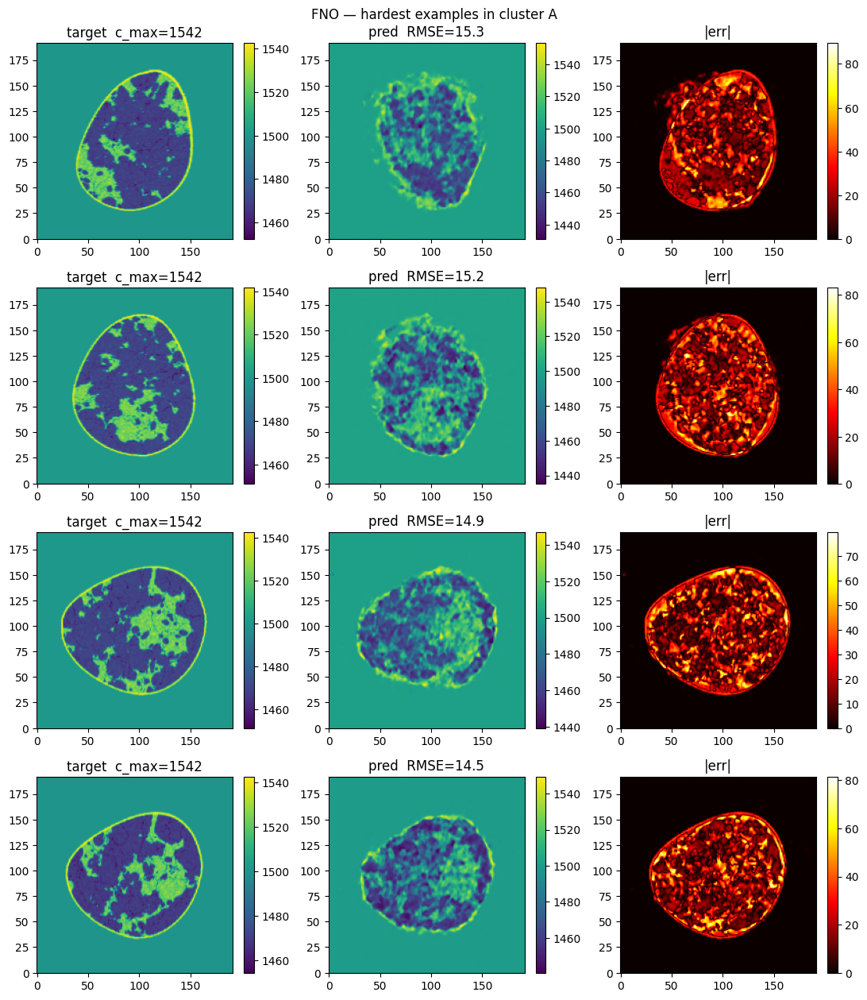

  saved /workspace/reference_points/diagnostic_v1/hard_examples_FNO_A.png


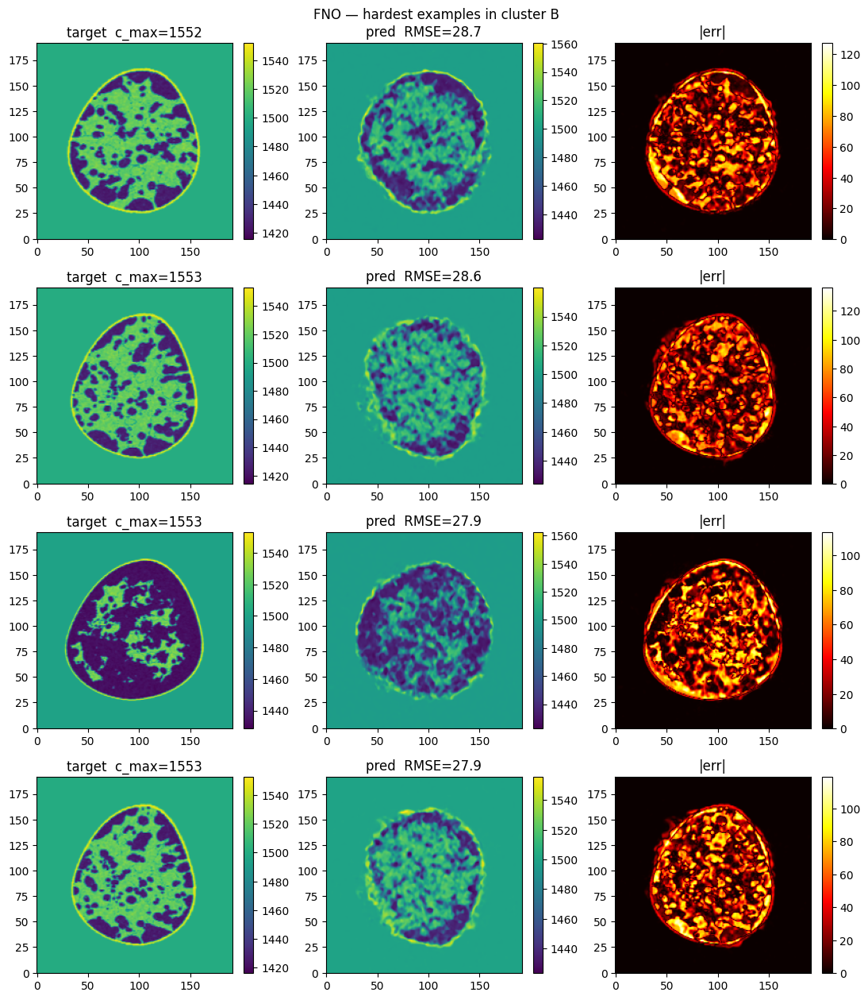

  saved /workspace/reference_points/diagnostic_v1/hard_examples_FNO_B.png


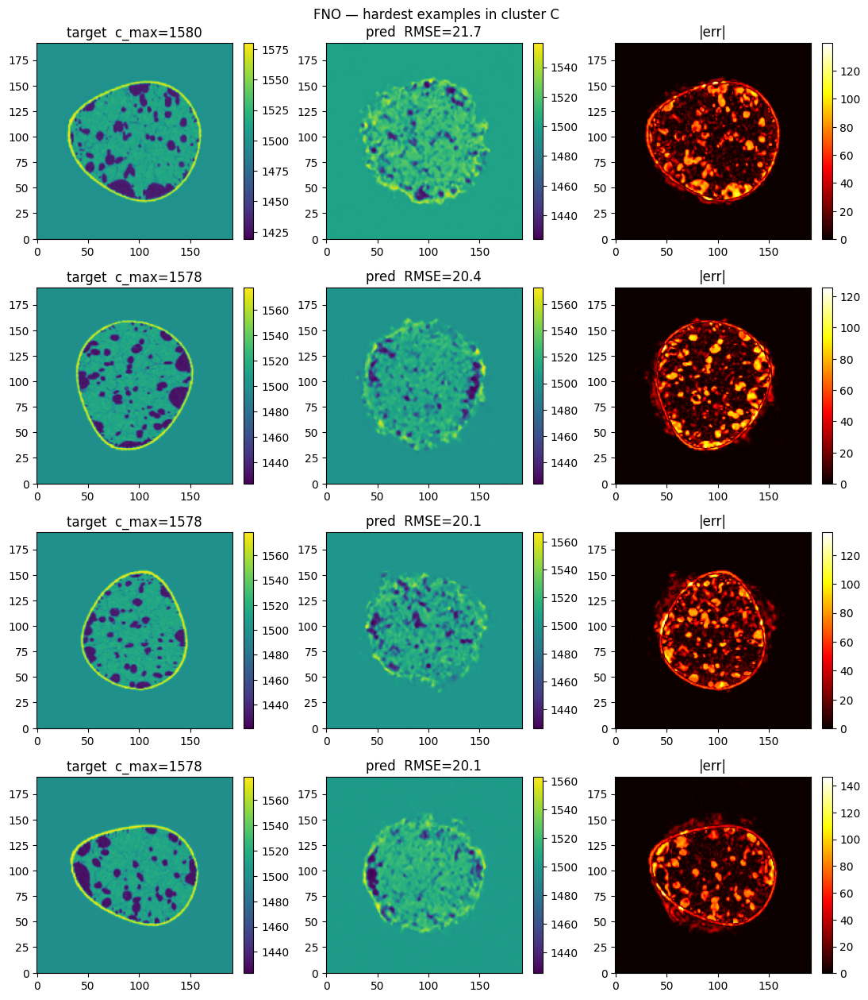

  saved /workspace/reference_points/diagnostic_v1/hard_examples_FNO_C.png


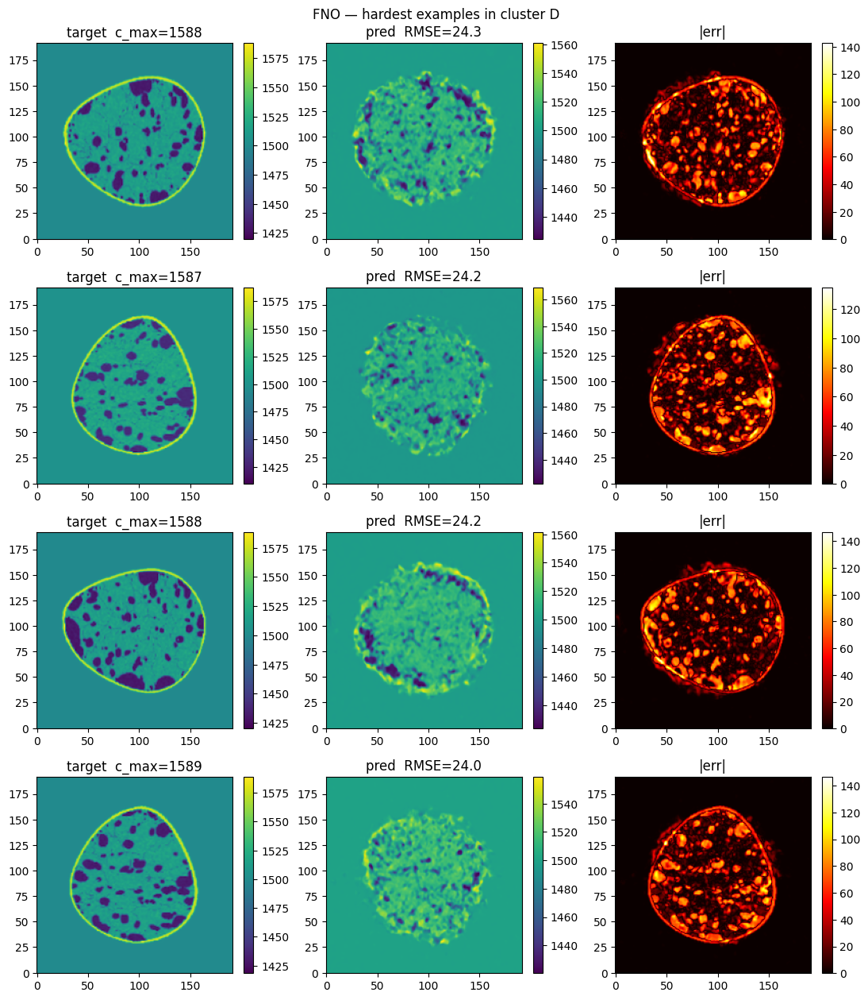

  saved /workspace/reference_points/diagnostic_v1/hard_examples_FNO_D.png


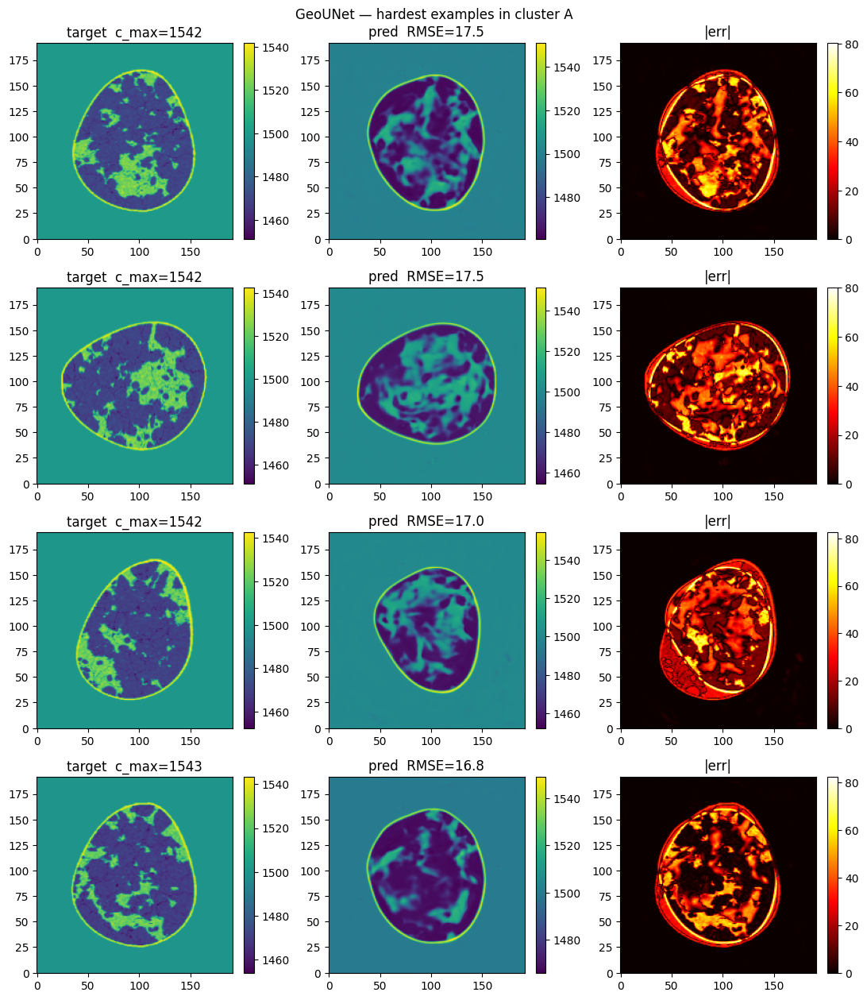

  saved /workspace/reference_points/diagnostic_v1/hard_examples_GeoUNet_A.png


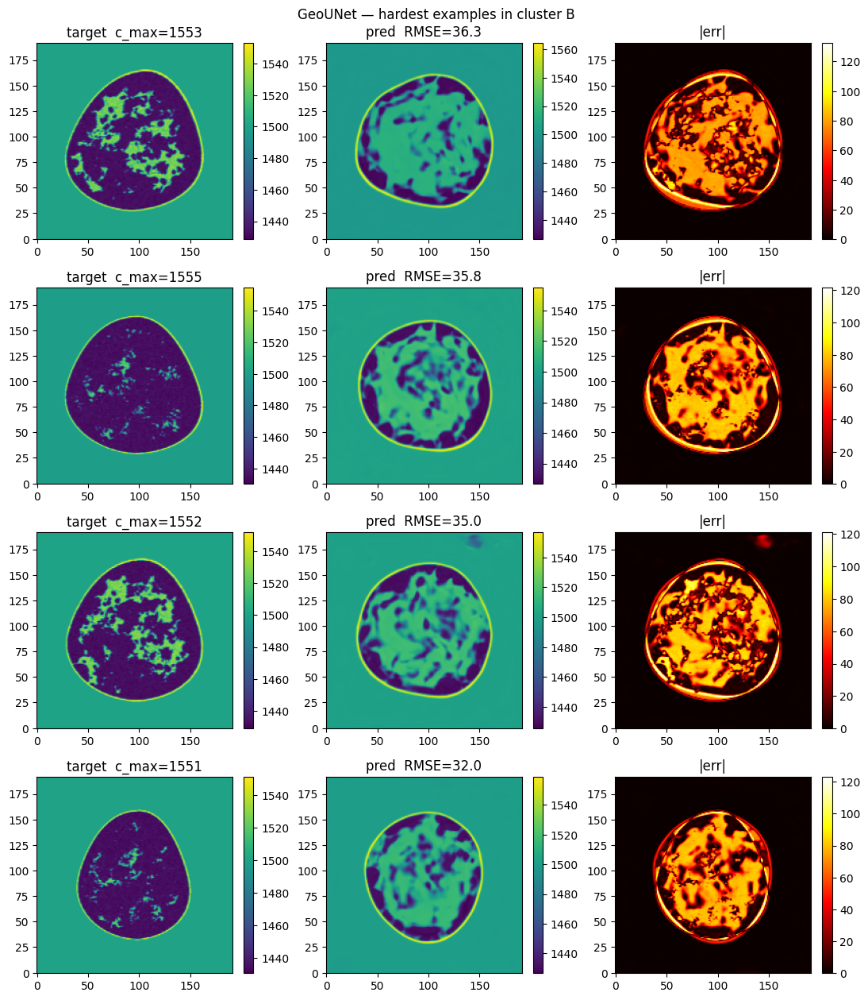

  saved /workspace/reference_points/diagnostic_v1/hard_examples_GeoUNet_B.png


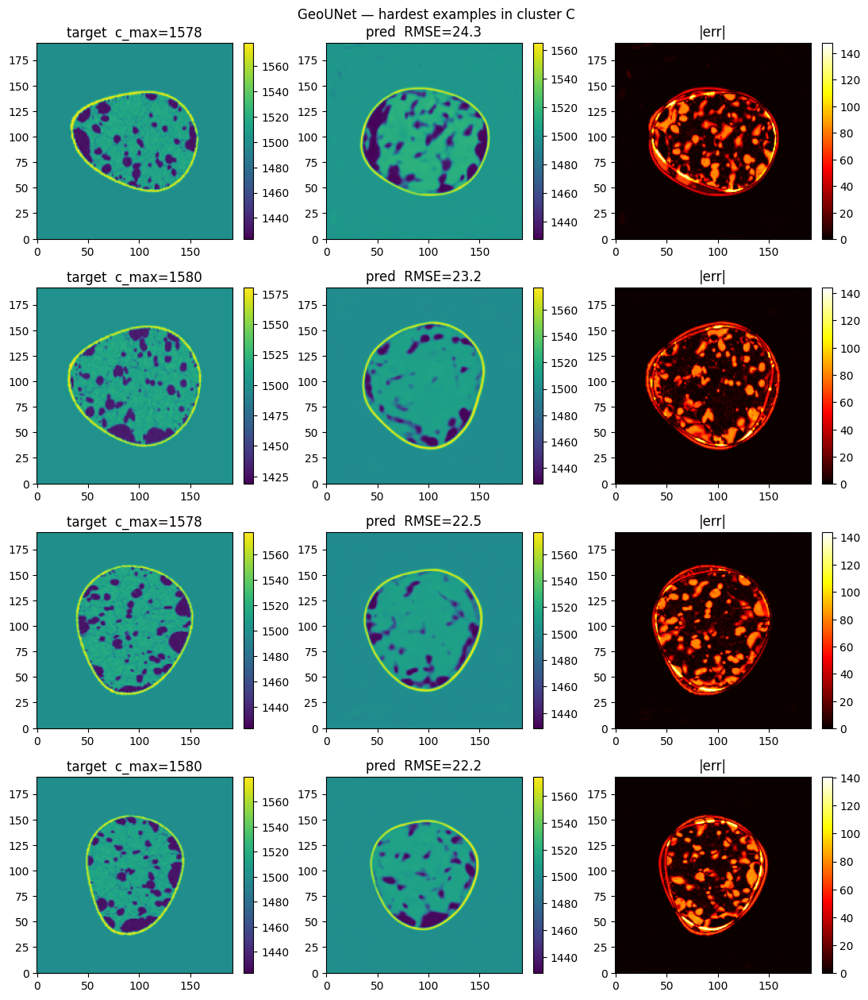

  saved /workspace/reference_points/diagnostic_v1/hard_examples_GeoUNet_C.png


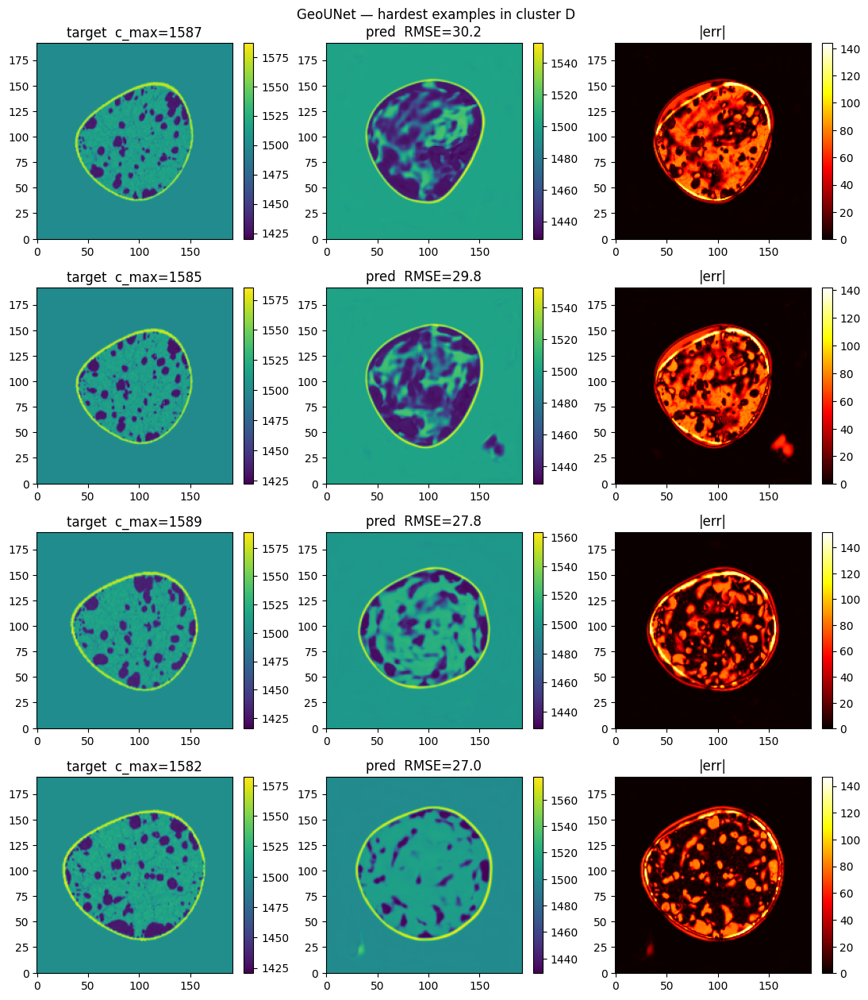

  saved /workspace/reference_points/diagnostic_v1/hard_examples_GeoUNet_D.png


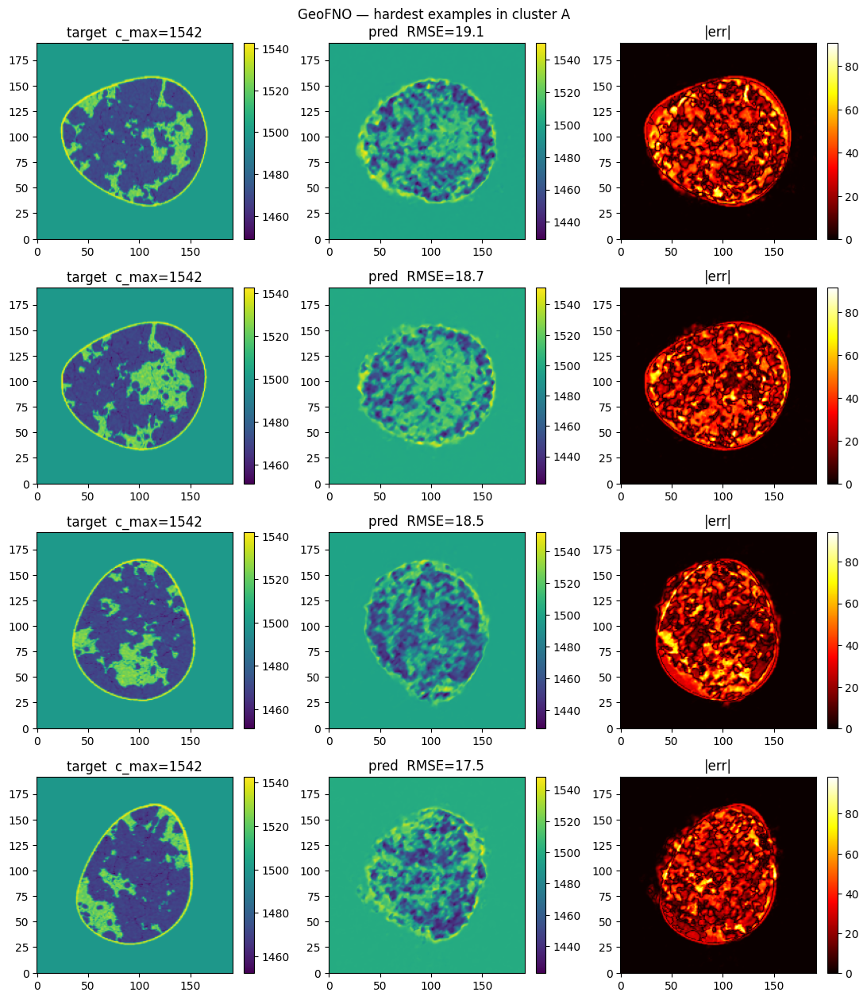

  saved /workspace/reference_points/diagnostic_v1/hard_examples_GeoFNO_A.png


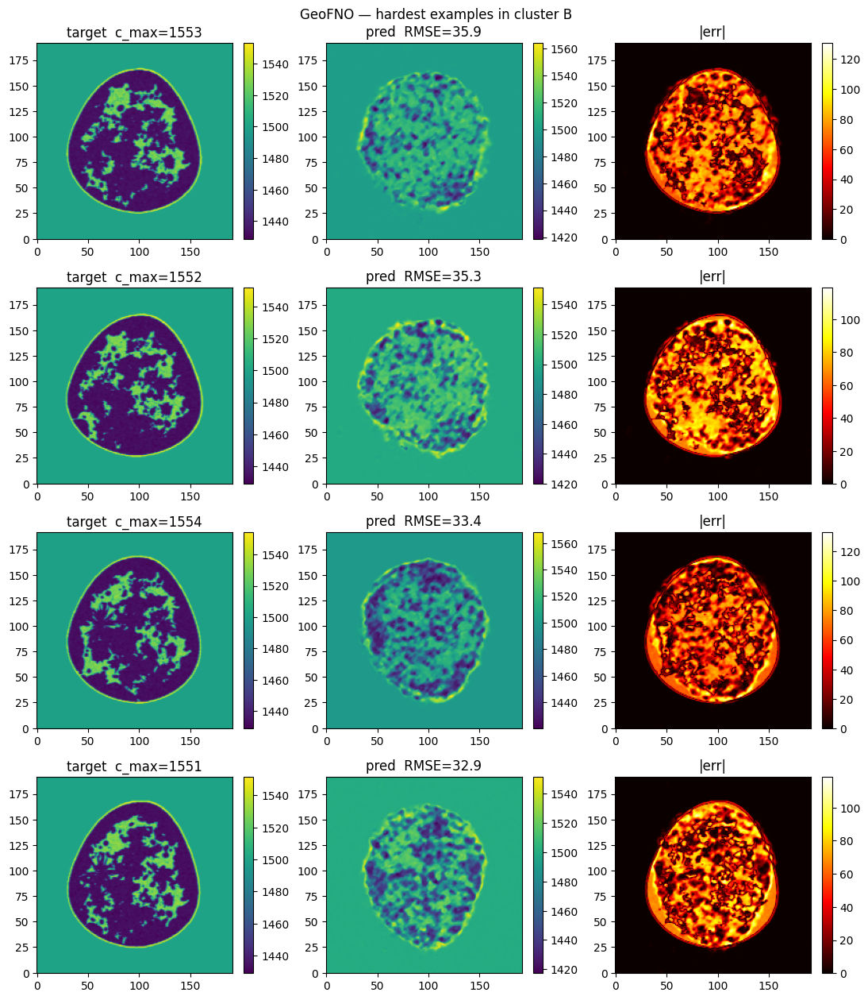

  saved /workspace/reference_points/diagnostic_v1/hard_examples_GeoFNO_B.png


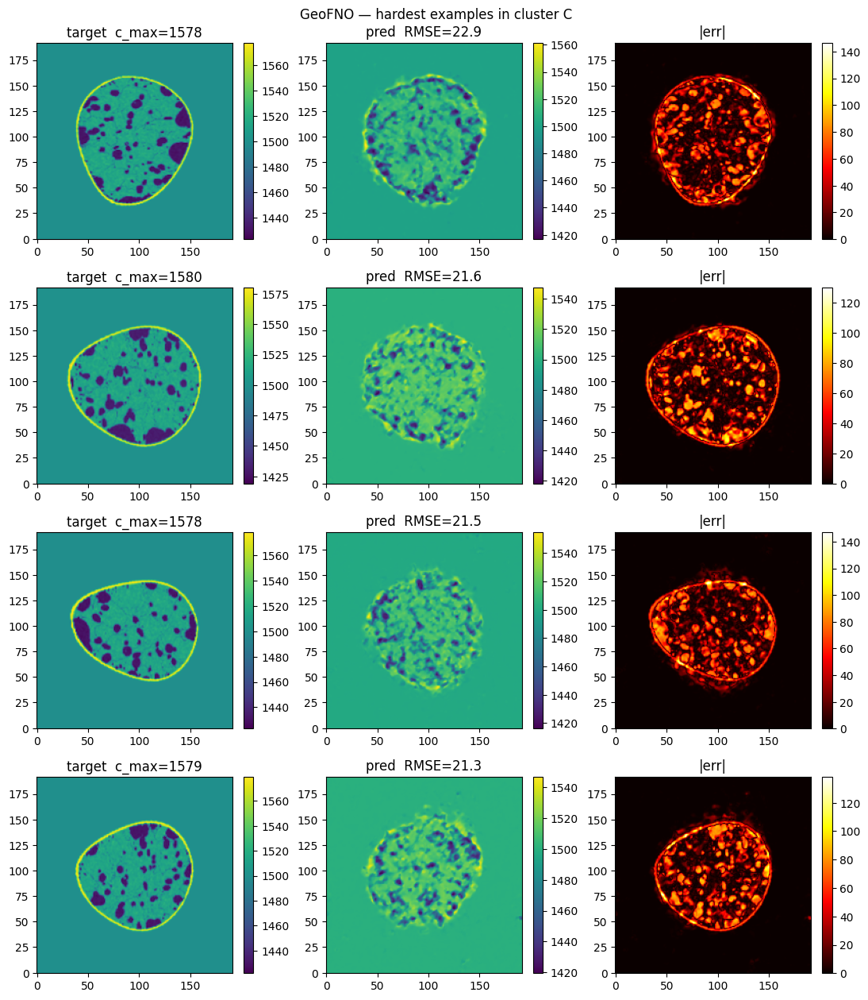

  saved /workspace/reference_points/diagnostic_v1/hard_examples_GeoFNO_C.png


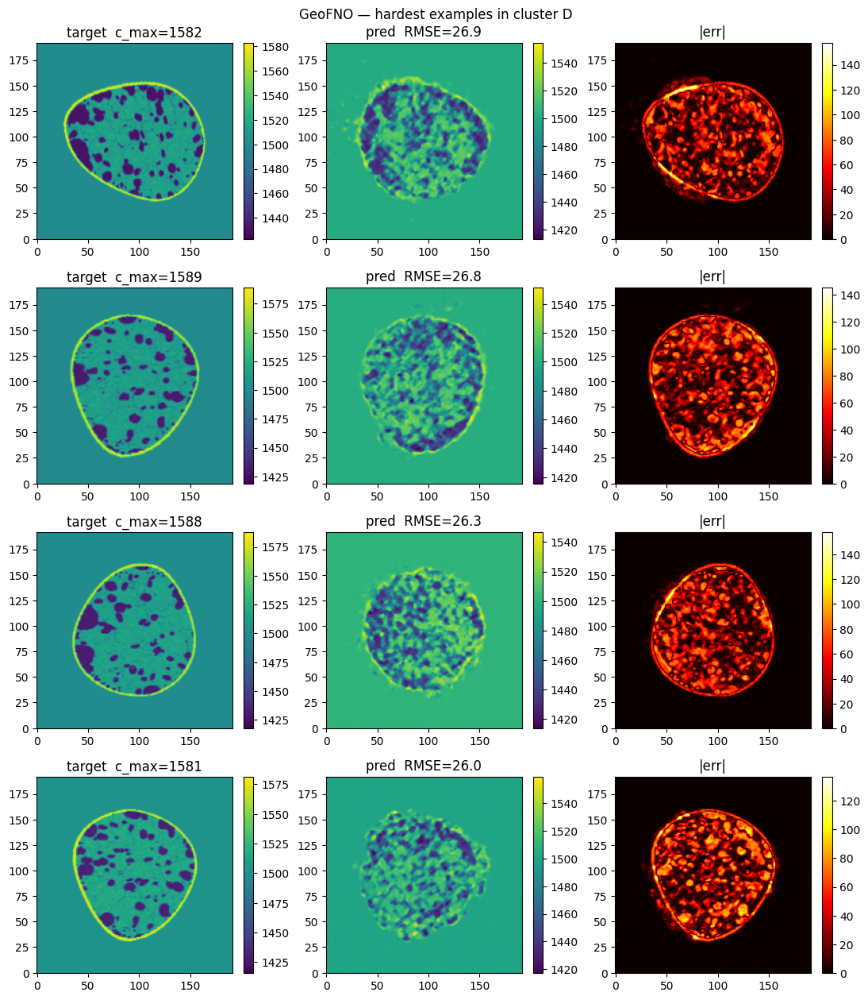

  saved /workspace/reference_points/diagnostic_v1/hard_examples_GeoFNO_D.png


In [18]:
def show_hardest_per_cluster(name, num=DIAG["num_hard_examples"]):
    mdl, predict_fn = models[name]
    metrics_list = agg[name]["per_sample"]
    rmses = np.array([m["rmse"] for m in metrics_list])

    for cn in cluster_names:
        idxs = np.where(sample_clusters == cn)[0]
        if len(idxs) == 0:
            continue
        rmses_in = rmses[idxs]
        order = np.argsort(rmses_in)[::-1][:num]
        worst_idx = idxs[order]

        fig, axes = plt.subplots(num, 3, figsize=(11, 3.2 * num))
        if num == 1:
            axes = axes.reshape(1, 3)
        for row, i in enumerate(worst_idx):
            sample = load_sample(test_files[i], c_min, c_max_global, M_hom_complex)
            pred = predict_fn(mdl, sample)
            target = sample["c_phys"]
            err = np.abs(pred - target)

            im0 = axes[row, 0].imshow(target, origin="lower")
            axes[row, 0].set_title(f"target  c_max={sample['meta']['c_max']:.0f}")
            plt.colorbar(im0, ax=axes[row, 0], fraction=0.046)

            im1 = axes[row, 1].imshow(pred, origin="lower")
            axes[row, 1].set_title(f"pred  RMSE={metrics_list[i]['rmse']:.1f}")
            plt.colorbar(im1, ax=axes[row, 1], fraction=0.046)

            im2 = axes[row, 2].imshow(err, origin="lower", cmap="hot")
            axes[row, 2].set_title("|err|")
            plt.colorbar(im2, ax=axes[row, 2], fraction=0.046)

        fig.suptitle(f"{name} — hardest examples in cluster {cn}", fontsize=12)
        plt.tight_layout()
        fig_path = out_dir / f"hard_examples_{name}_{cn}.png"
        plt.savefig(fig_path, dpi=110, bbox_inches="tight")
        plt.show()
        print(f"  saved {fig_path}")

for name in models.keys():
    show_hardest_per_cluster(name)

## 13. Финальный summary

Сводная таблица: какая модель в каком кластере выигрывает, кто доминирует
**стабильно** во всех кластерах, кто доминирует только в каких-то.

In [19]:
# Build LaTeX-friendly RMSE table
import io
buf = io.StringIO()
buf.write("\n=== Summary RMSE table (mean ± std) ===\n\n")
header = f"  {'model':<14}"
for cn in cluster_names:
    n = int((sample_clusters == cn).sum())
    header += f" {cn} (n={n:3d})        "
header += f" {'overall':<16}"
buf.write(header + "\n")
buf.write("  " + "-" * (len(header) - 2) + "\n")

for name in models.keys():
    row = f"  {name:<14}"
    for cn in cluster_names:
        s = per_cluster[name][cn]
        if s is None:
            row += f" {'n/a':<17}"
        else:
            row += f" {s['rmse_mean']:5.2f} ± {s['rmse_std']:4.2f}    "
    s = per_cluster[name]["overall"]
    row += f" {s['rmse_mean']:5.2f} ± {s['rmse_std']:4.2f}"
    buf.write(row + "\n")

print(buf.getvalue())
with open(out_dir / "summary_table.txt", "w", encoding="utf-8") as f:
    f.write(buf.getvalue())


=== Summary RMSE table (mean ± std) ===

  model          A (n=100)         B (n=600)         C (n= 15)         D (n= 85)         overall         
  -------------------------------------------------------------------------------------------------------
  DeepONet        9.27 ± 0.88     14.12 ± 4.00     16.09 ± 0.82     17.68 ± 1.48     13.93 ± 4.08
  FNO            11.77 ± 1.34     16.89 ± 5.02     19.42 ± 0.93     21.08 ± 1.59     16.74 ± 4.97
  GeoUNet        13.52 ± 1.40     18.92 ± 5.91     21.49 ± 1.24     23.40 ± 2.26     18.77 ± 5.74
  GeoFNO         14.02 ± 1.83     19.03 ± 5.78     20.35 ± 1.25     22.23 ± 1.87     18.76 ± 5.48



In [20]:
# Heuristic interpretation: averaged across clusters, what fraction of the error
# energy lies in HIGH frequency band?
print("\n=== Diagnostic interpretation ===\n")
print("  Fraction of HIGH-frequency error energy (|k| > {}), averaged over clusters:".format(mid_b))
print("  - high fraction (>0.5)  → modes/capacity ceiling (architecture-bound)")
print("  - low fraction  (<0.2)  → forward-operator nonlinearity (physics-bound)")
print()
for name in models.keys():
    high_easy_avg = np.mean([spec_table[name][cn]["easy"]["high"] for cn in cluster_names if cn in spec_table[name]])
    high_hard_avg = np.mean([spec_table[name][cn]["hard"]["high"] for cn in cluster_names if cn in spec_table[name]])
    if high_hard_avg > 0.5:
        verdict = "HIGH-band dominant → architecture-bound (try more modes / shallower bottleneck)"
    elif high_hard_avg < 0.2:
        verdict = "LOW/MID-band dominant → physics-bound (multi-frequency / unrolling needed)"
    else:
        verdict = "mixed regime — partial gains from both directions"
    print(f"  {name:<14}  easy_high={high_easy_avg:.2f}  hard_high={high_hard_avg:.2f}   →  {verdict}")


=== Diagnostic interpretation ===

  Fraction of HIGH-frequency error energy (|k| > 32), averaged over clusters:
  - high fraction (>0.5)  → modes/capacity ceiling (architecture-bound)
  - low fraction  (<0.2)  → forward-operator nonlinearity (physics-bound)

  DeepONet        easy_high=0.01  hard_high=0.01   →  LOW/MID-band dominant → physics-bound (multi-frequency / unrolling needed)
  FNO             easy_high=0.02  hard_high=0.01   →  LOW/MID-band dominant → physics-bound (multi-frequency / unrolling needed)
  GeoUNet         easy_high=0.02  hard_high=0.01   →  LOW/MID-band dominant → physics-bound (multi-frequency / unrolling needed)
  GeoFNO          easy_high=0.01  hard_high=0.01   →  LOW/MID-band dominant → physics-bound (multi-frequency / unrolling needed)


## 14. Save raw artifacts

Сохраняем всё, что может пригодиться для последующего анализа без перезапуска.

In [21]:
# Per-sample metrics for all models
all_metrics = {name: agg[name]["per_sample"] for name in models.keys()}
with open(out_dir / "per_sample_metrics.json", "w", encoding="utf-8") as f:
    json.dump(all_metrics, f, ensure_ascii=False, indent=2)

# Cluster assignments for the test set
cluster_assignments = {
    "test_files": [str(p) for p in test_files],
    "clusters": sample_clusters.tolist(),
    "cluster_edges_c_max": DIAG["cluster_edges_c_max"],
}
with open(out_dir / "cluster_assignments.json", "w", encoding="utf-8") as f:
    json.dump(cluster_assignments, f, ensure_ascii=False, indent=2)

# Average error maps (npz)
err_map_dump = {}
for name, by_cluster in cluster_error_maps.items():
    for cn, maps in by_cluster.items():
        err_map_dump[f"{name}__{cn}__easy"] = maps["easy_map"].astype(np.float32)
        err_map_dump[f"{name}__{cn}__hard"] = maps["hard_map"].astype(np.float32)
        err_map_dump[f"{name}__{cn}__target_easy"] = maps["target_easy_avg"].astype(np.float32)
        err_map_dump[f"{name}__{cn}__target_hard"] = maps["target_hard_avg"].astype(np.float32)
np.savez_compressed(out_dir / "average_error_maps.npz", **err_map_dump)

print(f"All diagnostic artifacts saved to: {out_dir}")
print("  - per_cluster_summary.json")
print("  - spectral_decomposition.json")
print("  - per_sample_metrics.json")
print("  - cluster_assignments.json")
print("  - average_error_maps.npz")
print("  - summary_table.txt")
print("  - error_maps_*.png")
print("  - spectral_decomposition.png")
print("  - hard_examples_*.png")

All diagnostic artifacts saved to: /workspace/reference_points/diagnostic_v1
  - per_cluster_summary.json
  - spectral_decomposition.json
  - per_sample_metrics.json
  - cluster_assignments.json
  - average_error_maps.npz
  - summary_table.txt
  - error_maps_*.png
  - spectral_decomposition.png
  - hard_examples_*.png


## 15. Constant-prediction baseline analysis

После того как мы посмотрели на error maps глазами и увидели «sun pattern» на
hard примерах кластера B, нужно проверить **количественно**: правда ли модель
просто угадывает константу = среднее target внутри маски фантома.

### План проверки

Для каждой модели на hard subset (top-25% по RMSE) сравниваем in-mask RMSE с
тремя константными baseline'ами:
- **oracle_const**: предсказание = `mean(target inside mask)` для данного примера.
  Это лучшая возможная константа при знании target.
- **bg_const**: предсказание = 1500 везде. Если модель близка — она вообще не
  «вошла» в фантом.
- **train_const**: предсказание = глобальное среднее target внутри маски по train.
  К этому модель сходится, если backward signal проваливается на сложных примерах.

Если `model_rmse / oracle_const > 0.95` — модель работает не лучше угадывания
константы. Это **mode collapse**, описанный в литературе по cycle-skipping.

Также пересчитываем **спектральную декомпозицию ошибки внутри маски** — без
доминирования фона, которое в первоначальной версии давало `low-band > 0.99` для
всех моделей и не показывало реальной частотной структуры.

### 15.1 Phantom mask и train_mean

Computing train_mean of in-phantom values...
TRAIN_MEAN (mean of in-phantom values across train): 1470.22 m/s

Sample 0: phantom area = 8750 pixels = 23.7% of grid


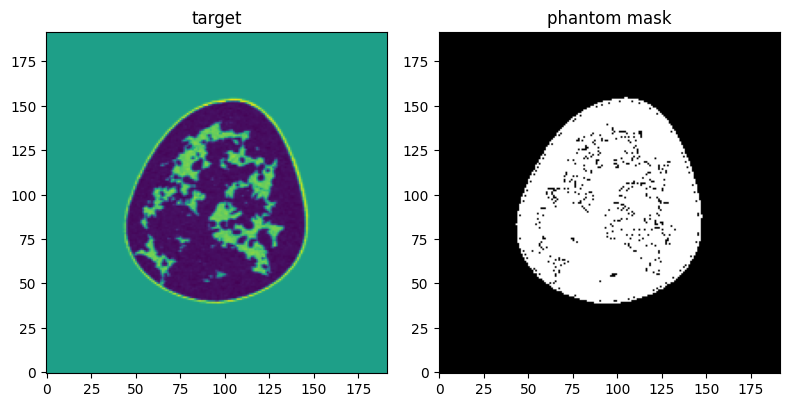

In [22]:
def phantom_mask(c_phys, threshold=10.0, background_value=1500.0):
    """Boolean (H, W) mask: pixels where target differs from background."""
    return np.abs(c_phys - background_value) > threshold

# Compute train_mean of in-phantom values once
print("Computing train_mean of in-phantom values...")
train_files_local = sorted((Path(DIAG["dataset_root"]) / "train").glob("*.npz"))
train_mask_means = []
for p in train_files_local:
    c = np.load(p)["c"].astype(np.float32)
    mk = phantom_mask(c)
    if mk.sum() > 0:
        train_mask_means.append(float(c[mk].mean()))
TRAIN_MEAN = float(np.mean(train_mask_means))
print(f"TRAIN_MEAN (mean of in-phantom values across train): {TRAIN_MEAN:.2f} m/s")

# Visual sanity check
sample0 = load_sample(test_files[0], stats["c_min"], stats["c_max"], M_hom_complex)
mk0 = phantom_mask(sample0["c_phys"])
print(f"\nSample 0: phantom area = {int(mk0.sum())} pixels = {mk0.sum() / (H*W) * 100:.1f}% of grid")
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(sample0["c_phys"], origin="lower"); ax[0].set_title("target")
ax[1].imshow(mk0, origin="lower", cmap="gray"); ax[1].set_title("phantom mask")
plt.tight_layout(); plt.show()

### 15.2 Constant baselines vs модель

Считаем in-mask RMSE для каждой модели и каждого кластера на hard subset.

In [23]:
def in_mask_rmse(pred, target, mask):
    if mask.sum() == 0:
        return 0.0
    diff = (pred - target)[mask]
    return float(np.sqrt(np.mean(diff ** 2)))

def constant_baselines_for_sample(target, pred, mask, train_mean, background_value=1500.0):
    """Returns dict of in-mask RMSEs for the model and three const baselines."""
    if mask.sum() == 0:
        return None
    target_mean = float(target[mask].mean())
    pred_mean = float(pred[mask].mean())
    return {
        "model_rmse":          in_mask_rmse(pred, target, mask),
        "oracle_const_rmse":   in_mask_rmse(np.full_like(target, target_mean), target, mask),
        "bg_const_rmse":       in_mask_rmse(np.full_like(target, background_value), target, mask),
        "train_const_rmse":    in_mask_rmse(np.full_like(target, train_mean), target, mask),
        "target_mean":         target_mean,
        "pred_mean":           pred_mean,
        "bias":                pred_mean - target_mean,
    }

# Iterate over hard examples per cluster, per model
const_results = {name: {} for name in models.keys()}
for name in models.keys():
    mdl, predict_fn = models[name]
    metrics_list = agg[name]["per_sample"]
    rmses = np.array([m["rmse"] for m in metrics_list])
    for cn in cluster_names:
        idxs = np.where(sample_clusters == cn)[0]
        if len(idxs) == 0:
            continue
        rmses_in = rmses[idxs]
        hard_thresh = np.quantile(rmses_in, DIAG["hard_quantile"])
        hard_idx = idxs[rmses_in >= hard_thresh]

        rows = []
        for i in hard_idx:
            sample = load_sample(test_files[i], stats["c_min"], stats["c_max"], M_hom_complex)
            pred = predict_fn(mdl, sample)
            target = sample["c_phys"]
            mk = phantom_mask(target)
            r = constant_baselines_for_sample(target, pred, mk, TRAIN_MEAN)
            if r is not None:
                rows.append(r)

        if not rows:
            continue
        const_results[name][cn] = {k: float(np.mean([r[k] for r in rows])) for k in rows[0].keys()}
        const_results[name][cn]["n"] = len(rows)

# Pretty-print summary table
print("\n=== In-mask RMSE on HARD examples (top-25% by RMSE) ===")
print("  Compare model to constant baselines.  All values in m/s.\n")
print("  oracle = mean(target inside mask)  |  bg = 1500 everywhere  |  train = global TRAIN_MEAN")
print()
header = f"  {'model':<12}{'cluster':<6}{'n':>4}{'model':>10}{'oracle':>10}{'bg=1500':>10}{'train':>10}{'bias':>10}"
print(header)
print("  " + "-" * (len(header) - 2))
for name in models.keys():
    for cn in cluster_names:
        r = const_results[name].get(cn)
        if r is None:
            continue
        print(f"  {name:<12}{cn:<6}{r['n']:>4}{r['model_rmse']:>10.2f}"
              f"{r['oracle_const_rmse']:>10.2f}{r['bg_const_rmse']:>10.2f}"
              f"{r['train_const_rmse']:>10.2f}{r['bias']:>+10.2f}")
    print()

with open(out_dir / "const_baseline_comparison.json", "w", encoding="utf-8") as f:
    json.dump(const_results, f, ensure_ascii=False, indent=2)
print(f"saved to {out_dir / 'const_baseline_comparison.json'}")


=== In-mask RMSE on HARD examples (top-25% by RMSE) ===
  Compare model to constant baselines.  All values in m/s.

  oracle = mean(target inside mask)  |  bg = 1500 everywhere  |  train = global TRAIN_MEAN

  model       cluster   n     model    oracle   bg=1500     train      bias
  -------------------------------------------------------------------------
  DeepONet    A       25     17.58     23.28     28.50     26.85     +0.25
  DeepONet    B      150     34.25     40.09     50.39     42.89     +1.90
  DeepONet    C        4     33.29     37.38     37.42     47.47     -3.58
  DeepONet    D       22     34.95     37.85     37.90     47.80     -4.06

  FNO         A       25     23.14     23.40     28.46     27.09     +0.55
  FNO         B      150     40.80     39.51     50.90     42.23     +4.09
  FNO         C        4     40.27     37.38     37.42     47.47     +4.62
  FNO         D       22     41.41     37.89     37.94     47.86     +5.02

  GeoUNet     A       25     26.48   

### 15.3 Auto-interpretation

`model_rmse / oracle_const < 0.7` — модель добавляет реальную структуру.
`0.7-0.95` — частичное восстановление. `> 0.95` — collapse to constant.

In [24]:
print("\n=== Auto-interpretation ===\n")
print("  Verdict per (model, cluster) on HARD subset:")
print("  - model/oracle < 0.7   → real structure recovery")
print("  - 0.7 .. 0.95          → weak: partial structure")
print("  - > 0.95               → COLLAPSE: effectively constant prediction")
print()
for name in models.keys():
    print(f"  {name}")
    for cn in cluster_names:
        r = const_results[name].get(cn)
        if r is None:
            continue
        ratio = r["model_rmse"] / max(r["oracle_const_rmse"], 1e-6)
        bias = r["bias"]
        if ratio > 0.95:
            verdict = "COLLAPSE: model ≈ constant"
        elif ratio > 0.7:
            verdict = "weak: partial structure"
        else:
            verdict = "OK: real structure"
        print(f"    cluster {cn}:  ratio={ratio:.2f}   bias={bias:+6.1f} m/s   →  {verdict}")
    print()


=== Auto-interpretation ===

  Verdict per (model, cluster) on HARD subset:
  - model/oracle < 0.7   → real structure recovery
  - 0.7 .. 0.95          → weak: partial structure
  - > 0.95               → COLLAPSE: effectively constant prediction

  DeepONet
    cluster A:  ratio=0.76   bias=  +0.3 m/s   →  weak: partial structure
    cluster B:  ratio=0.85   bias=  +1.9 m/s   →  weak: partial structure
    cluster C:  ratio=0.89   bias=  -3.6 m/s   →  weak: partial structure
    cluster D:  ratio=0.92   bias=  -4.1 m/s   →  weak: partial structure

  FNO
    cluster A:  ratio=0.99   bias=  +0.6 m/s   →  COLLAPSE: model ≈ constant
    cluster B:  ratio=1.03   bias=  +4.1 m/s   →  COLLAPSE: model ≈ constant
    cluster C:  ratio=1.08   bias=  +4.6 m/s   →  COLLAPSE: model ≈ constant
    cluster D:  ratio=1.09   bias=  +5.0 m/s   →  COLLAPSE: model ≈ constant

  GeoUNet
    cluster A:  ratio=1.14   bias=  -0.0 m/s   →  COLLAPSE: model ≈ constant
    cluster B:  ratio=1.18   bias=  +3.7 

### 15.4 Визуализация: модель vs const-baselines

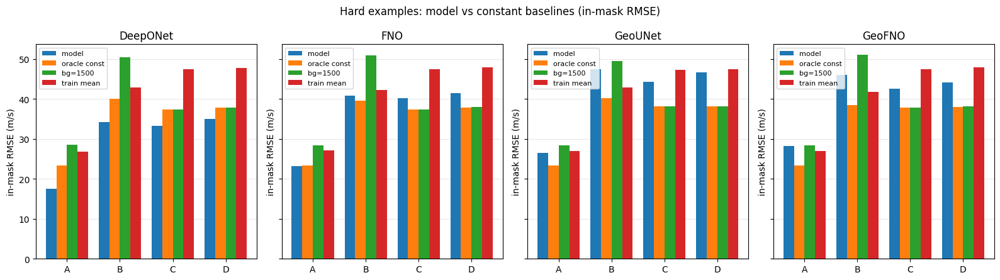

saved to /workspace/reference_points/diagnostic_v1/const_baseline_comparison.png


In [25]:
fig, axes = plt.subplots(1, len(models), figsize=(4 * len(models), 4.5), sharey=True)
if len(models) == 1:
    axes = [axes]

xs = np.arange(len(cluster_names))
width = 0.20

for ax, name in zip(axes, models.keys()):
    vals_model, vals_oracle, vals_bg, vals_train = [], [], [], []
    for cn in cluster_names:
        r = const_results[name].get(cn)
        if r is None:
            for L in (vals_model, vals_oracle, vals_bg, vals_train):
                L.append(0)
        else:
            vals_model.append(r["model_rmse"])
            vals_oracle.append(r["oracle_const_rmse"])
            vals_bg.append(r["bg_const_rmse"])
            vals_train.append(r["train_const_rmse"])

    ax.bar(xs - 1.5 * width, vals_model, width, label="model")
    ax.bar(xs - 0.5 * width, vals_oracle, width, label="oracle const")
    ax.bar(xs + 0.5 * width, vals_bg, width, label="bg=1500")
    ax.bar(xs + 1.5 * width, vals_train, width, label="train mean")

    ax.set_xticks(xs)
    ax.set_xticklabels(cluster_names)
    ax.set_title(name)
    ax.set_ylabel("in-mask RMSE (m/s)")
    ax.legend(fontsize=8, loc="upper left")
    ax.set_axisbelow(True)
    ax.grid(axis="y", alpha=0.3)

fig.suptitle("Hard examples: model vs constant baselines (in-mask RMSE)", fontsize=12)
plt.tight_layout()
fig_path = out_dir / "const_baseline_comparison.png"
plt.savefig(fig_path, dpi=120, bbox_inches="tight")
plt.show()
print(f"saved to {fig_path}")

## 16. Spectral decomposition внутри маски фантома

В разделе 11 спектральная декомпозиция считалась на полной error map. Фон (90%
площади, нулевая ошибка) доминировал в Фурье-разложении, и для всех моделей
получалось `low-band > 0.99` — это **artifact фона**, а не реальная картина.

Здесь пересчитываем спектр на error map с **обнулённым фоном** (значения
оставляем только внутри маски фантома). Это показывает реальное распределение
ошибки по частотам внутри объекта.

In [26]:
def freq_band_energy_masked(err_map, mask, low_band, mid_band):
    """Spectral energy fractions of (err_map * mask) — background zeroed out."""
    masked = err_map * mask
    F = np.fft.rfft2(masked)
    Hf, Wf = F.shape
    ky = np.fft.fftfreq(Hf, d=1.0) * Hf
    kx = np.arange(Wf)
    KY, KX = np.meshgrid(ky, kx, indexing="ij")
    K = np.sqrt(KY * KY + KX * KX)
    energy = np.abs(F) ** 2
    total = energy.sum()
    if total < 1e-12:
        return {"low": 0.0, "mid": 0.0, "high": 0.0, "total": 0.0}
    e_low  = energy[K <= low_band].sum()
    e_mid  = energy[(K > low_band) & (K <= mid_band)].sum()
    e_high = energy[K > mid_band].sum()
    return {"low": float(e_low / total), "mid": float(e_mid / total),
            "high": float(e_high / total), "total": float(total)}


# Recompute on cluster-averaged error maps (already in cluster_error_maps from sec 10).
masked_spec = {}
print("\n=== Masked spectral decomposition (background pixels zeroed) ===\n")
for name in models.keys():
    if name not in cluster_error_maps:
        continue
    masked_spec[name] = {}
    print(f"  {name}")
    print(f"    {'cluster':<10}{'easy_low':>9}{'easy_mid':>9}{'easy_high':>10}"
          f"   {'hard_low':>9}{'hard_mid':>9}{'hard_high':>10}")
    for cn, maps in cluster_error_maps[name].items():
        mask_easy = phantom_mask(maps["target_easy_avg"])
        mask_hard = phantom_mask(maps["target_hard_avg"])
        be = freq_band_energy_masked(maps["easy_map"], mask_easy,
                                     DIAG["freq_band_low"], DIAG["freq_band_mid"])
        bh = freq_band_energy_masked(maps["hard_map"], mask_hard,
                                     DIAG["freq_band_low"], DIAG["freq_band_mid"])
        masked_spec[name][cn] = {"easy": be, "hard": bh}
        print(f"    {cn:<10}{be['low']:9.3f}{be['mid']:9.3f}{be['high']:10.3f}"
              f"   {bh['low']:9.3f}{bh['mid']:9.3f}{bh['high']:10.3f}")
    print()

with open(out_dir / "spectral_decomposition_masked.json", "w", encoding="utf-8") as f:
    json.dump(masked_spec, f, ensure_ascii=False, indent=2)
print(f"saved to {out_dir / 'spectral_decomposition_masked.json'}")


=== Masked spectral decomposition (background pixels zeroed) ===

  DeepONet
    cluster    easy_low easy_mid easy_high    hard_low hard_mid hard_high
    A             0.907    0.048     0.045       0.910    0.047     0.043
    B             0.974    0.017     0.009       0.988    0.007     0.005
    C             0.656    0.145     0.199       0.651    0.146     0.203
    D             0.602    0.214     0.184       0.609    0.214     0.178

  FNO
    cluster    easy_low easy_mid easy_high    hard_low hard_mid hard_high
    A             0.865    0.068     0.067       0.904    0.054     0.042
    B             0.973    0.017     0.010       0.990    0.007     0.003
    C             0.648    0.175     0.177       0.626    0.171     0.203
    D             0.606    0.205     0.190       0.624    0.213     0.164

  GeoUNet
    cluster    easy_low easy_mid easy_high    hard_low hard_mid hard_high
    A             0.888    0.055     0.057       0.898    0.051     0.051
    B           

In [27]:
print("\n=== Diagnostic interpretation (MASKED spectral) ===\n")
print(f"  Fraction of HIGH-frequency error energy (|k| > {DIAG['freq_band_mid']}):")
print("  - high fraction (>0.4)  → modes/capacity ceiling (architecture-bound)")
print("  - low fraction  (<0.15) → forward-operator nonlinearity / mode collapse (physics-bound)")
print()
for name in models.keys():
    if name not in masked_spec:
        continue
    high_easy_avg = np.mean([masked_spec[name][cn]["easy"]["high"] for cn in masked_spec[name]])
    high_hard_avg = np.mean([masked_spec[name][cn]["hard"]["high"] for cn in masked_spec[name]])
    if high_hard_avg > 0.4:
        verdict = "HIGH-band → architecture-bound (more modes / less aggressive bottleneck)"
    elif high_hard_avg < 0.15:
        verdict = "LOW/MID-band → physics-bound (multi-frequency, unrolling) or mode collapse"
    else:
        verdict = "mixed regime — partial gains from both directions"
    print(f"  {name:<14}  easy_high={high_easy_avg:.2f}  hard_high={high_hard_avg:.2f}   →  {verdict}")


=== Diagnostic interpretation (MASKED spectral) ===

  Fraction of HIGH-frequency error energy (|k| > 32):
  - high fraction (>0.4)  → modes/capacity ceiling (architecture-bound)
  - low fraction  (<0.15) → forward-operator nonlinearity / mode collapse (physics-bound)

  DeepONet        easy_high=0.11  hard_high=0.11   →  LOW/MID-band → physics-bound (multi-frequency, unrolling) or mode collapse
  FNO             easy_high=0.11  hard_high=0.10   →  LOW/MID-band → physics-bound (multi-frequency, unrolling) or mode collapse
  GeoUNet         easy_high=0.11  hard_high=0.11   →  LOW/MID-band → physics-bound (multi-frequency, unrolling) or mode collapse
  GeoFNO          easy_high=0.12  hard_high=0.11   →  LOW/MID-band → physics-bound (multi-frequency, unrolling) or mode collapse
